<h1 style='color:orange; font-weight:bold; text-align:center'>Investigating Key Themes in GoPay User Feedback: A Topic Modeling Approach</h1>

aaa

Dataset: [here](https://www.kaggle.com/datasets/imamsatrio/app-store-gojek-reviews)

## **1 Introduction**
<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147;">
    <strong>Note:</strong> Topic and theme refer to different ideas in academic writing. Topic denotes a specific subject matter whereas theme refers to the underlying idea from the topic. On the other hand, they are usually used interchangeably in topic modeling to mean underlying patterns or clusters of words representing different ideas in a corpus. 
</div>

In [344]:
import re
import pandas as pd
pd.options.display.max_colwidth=50
import nltk
from nltk.corpus import stopwords
from gensim import corpora
from gensim.models import LdaModel
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt
import numpy as np
plt.style.use('ggplot')
from collections import Counter
import seaborn as sns
import time
from sklearn.manifold import TSNE
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from langdetect import detect, DetectorFactory
from langdetect.lang_detect_exception import LangDetectException
import matplotlib.dates as mdates
from wordcloud import WordCloud

## **2 General Overview**
- What is the structure of the dataset?
- What are the columns and their data types?
- Are there any missing values in the dataset?
- How prevalent are missing values in each column?

In [345]:
# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

In [346]:
# create function to inspect df
def inspect_dataframe(df):
    summary = {
        'ColumnName': df.columns.values.tolist(),
        'Nrow': df.shape[0],
        'DataType': df.dtypes.values.tolist(),
        'NAPct': (df.isna().mean() * 100).round(2).tolist(),
        'DuplicatePct': (df.duplicated().sum()/len(df)*100).round(2),
        'UniqueValue': df.nunique().tolist(),
        'Sample': [df[col].unique() for col in df.columns]
    }
    return pd.DataFrame(summary)

In [347]:
# inspect dataframe
print(f'The dataframe contains {df4.shape[0]} rows and {df4.shape[1]} cols.')
print(f"- {len(df4.select_dtypes(include='number').columns)} are numeric cols")
print(f"- {len(df4.select_dtypes(include='O').columns)} are object cols")
inspect_dataframe(df4)

The dataframe contains 123253 rows and 6 cols.
- 2 are numeric cols
- 4 are object cols


,ColumnName,Nrow,DataType,NAPct,DuplicatePct,UniqueValue,Sample
0,userName,123253,object,0.00,0.0,1747,"[Pengguna Google, bang Kozu, fadilah saputra, ..."
1,content,123253,object,0.00,0.0,78431,"[Mantap, Bagus dan mudah digunakan, Good, Sang..."
2,score,123253,int64,0.00,0.0,5,"[5, 4, 1, 2, 3]"
3,thumbsUpCount,123253,int64,0.00,0.0,252,"[0, 1, 3, 11369, 2, 51, 10, 46, 204, 24, 19, 7..."
4,reviewCreatedVersion,123253,object,12.92,0.0,40,"[1.24.1, 1.23.0, nan, 1.26.1, 1.17.0, 1.15.1, ..."
5,at,123253,object,0.00,0.0,122902,"[2024-07-07 16:58:06, 2024-07-07 16:57:08, 202..."


**Note**
- Preprocessing pindah ke modeling aja. Jadi dari EDA dapet insights apa yg guide kalo beberapa kata perlu dihilangkan untuk topic modeling.
- Data cleaning 

## **3 Exploratory Data Analysis**

### **3.1 User Engagement**
- ✅ How many users gave each score (1-5)?
- ✅ Which reviews received the most thumbs up?
- ✅ How does user engagement (thumbsUpCount) vary with scores?
- ❌ Is there a correlation between the thumbs up count and the score given?

#### **3.1.1 How many users give each score?**
Overall, do GoPay app users satisfied with the app?

In [348]:
score_df = df4['score'].value_counts().reset_index().round(2)
total_count = score_df['count'].sum()

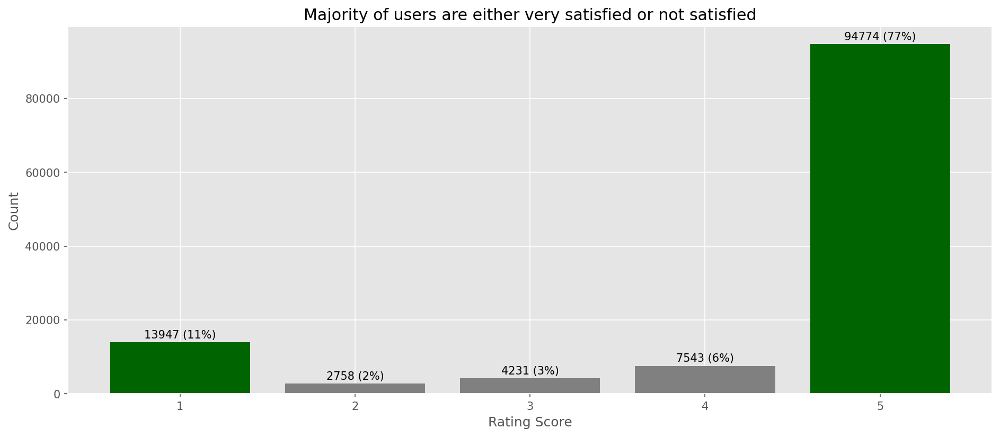

In [349]:
# create a color list for the bars
colors = ['darkgreen' if score in [1, 5] else 'grey' for score in score_df['score']]

# create the bar plot
plt.figure(figsize=(15, 6), dpi=150)
ax = plt.bar(score_df['score'], score_df['count'], 
             color=colors)

# add data labels 
for bar in ax:
    yval = bar.get_height()
    percentage = (yval / total_count) * 100  
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 500, 
             f'{yval} ({percentage:.0f}%)', 
             ha='center', va='bottom')

plt.xlabel('Rating Score')
plt.ylabel('Count')
plt.title('Majority of users are either very satisfied or not satisfied')
plt.xticks(score_df['score']) 
plt.show()

#### **3.1.2 Which reviews have the most thumbs up?**

In [350]:
(df4.nlargest(n=5, columns='thumbsUpCount')
 .iloc[:, 0:4]
 .style.background_gradient(subset=['thumbsUpCount'], cmap='YlOrRd'))

,userName,content,score,thumbsUpCount
539,Pengguna Google,"WOI banget aplikasi ini, semua fungsi e banking bisa dilakukan di sini. Transfer ke semua rekening bank lancar real time dan gratis. Selain transfer bisa juga bayar rekening listrik, telepon, internet, PDAM, top up e wallet dll. Bukti bayar atau transfer dgn mudah dishare ke WA dll. Setelah sempat hilangkan nama tujuan transfer, skrg sdh muncul lagi. Saatnya kembali gunakan Gopay..",5,11369
84341,Pengguna Google,"Semua fiturnya gampang buat digunakan, tampilan UI nya buat pemula kayak saya cukup oke sih, gampang di pahami. Kemarin nyobain top up masuknya cepet, oh iya ada banyak promo juga buat pengguna baru, sejauh ini belum nemu bug sih",5,8109
47854,Pengguna Google,"Sudah cukup baik, permudah pengguna dalam lakukan transaksi keuangan khususnya, baik top up maupun transaksi pembayaran2, tingkatkan terus , cuma sayangnya saya yg tdk pernah telat apalagi nunggak bayaran paylater & selalu bayar penuh, tetap saja susah dapatin fasilitas Gopay Pinjam apalagi limit paylater yg besar. Mohon perhatiannya, sukses selalu",5,5736
113082,Pengguna Google,"Aplikasinya bagus banget dan ngebantu banget, kalau mau beli pulsa atau paket data jadi lebih gampang, bisa bayar listrik juga, mau transfer uang juga mudah dan ga ada biaya transfernya juga, mantap pokoknya.fitur didalamnya juga simpel tapi tetep modern,.. Pokoknya rekomended banget deh gopay ini☺️",5,4169
105623,Pengguna Google,"Aplikasinya bener"" memudahkan banget transfer tanpa ribet, buat beli pulsa dan daya juga tinggal klik"" , trus mau transfer pun gada biaya admin. bayar listrik juga bisa ih suka banget. fitur"" nya juga gampang dipahami rekomended banget deh pokoknya.",5,1810


<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147;">
    <strong>Key Takeaway:</strong> Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.
</div>

### **3.2 Temporal Analysis**
- How does the distribution of scores change over time?
- Is there a trend in scores over the different versions of the app?
- Are there any seasonal patterns in user reviews?
- Do certain times of year correlate with higher or lower scores?

#### **3.2.1 Are there any temporal patterns in user rating scores?**

In [351]:
# prepare dataset
df4['at'] = pd.to_datetime(df4['at'])  
daily_scores = df4.groupby(df4['at'].dt.date)['score'].mean().reset_index()

# Calculate IQR for the scores
Q1 = daily_scores['score'].quantile(0.25)
Q3 = daily_scores['score'].quantile(0.75)
IQR = Q3 - Q1
lower_threshold = Q1 - 1.5 * IQR
upper_threshold = Q3 + 1.5 * IQR

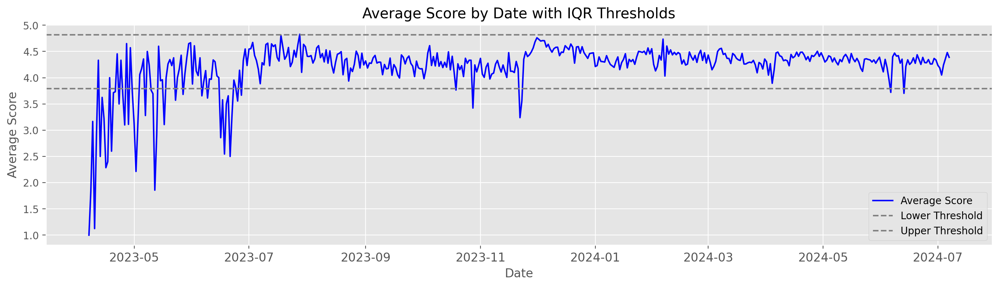

In [352]:
# Plotting
plt.figure(figsize=(17, 4), dpi=200)
plt.plot(daily_scores['at'], daily_scores['score'], 
         linestyle='-', color='b', label='Average Score')
plt.axhline(lower_threshold, color='grey', linestyle='--', label='Lower Threshold')
plt.axhline(upper_threshold, color='grey', linestyle='--', label='Upper Threshold')
plt.title('Average Score by Date with IQR Thresholds')
plt.xlabel('Date')
plt.ylabel('Average Score')
plt.xticks(rotation=0, fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

In [353]:
# Group by month and calculate the average score
monthly_scores = df4.resample('M', on='at')['score'].mean().reset_index()
monthly_scores['at'] = monthly_scores['at'].dt.strftime('%Y-%m')
monthly_scores['at'] = pd.to_datetime(monthly_scores['at'])

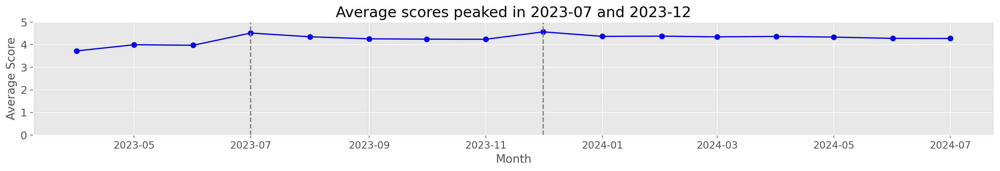

In [354]:
# Plotting
plt.figure(figsize=(17, 3), dpi=200)
plt.plot(monthly_scores['at'], monthly_scores['score'], marker='o', linestyle='-', color='b')
plt.axvline(pd.to_datetime('2023-07-01'), color='grey', linestyle='--', label='Peak in 2023-07')
plt.axvline(pd.to_datetime('2023-12-01'), color='grey', linestyle='--', label='Peak in 2023-12')
plt.title('Average scores peaked in 2023-07 and 2023-12', size=18)
plt.xlabel('Month', size=14)
plt.ylabel('Average Score', size=14)
plt.xticks(rotation=0, fontsize=12)
plt.yticks(np.arange(0, 6, 1), rotation=0, fontsize=13)
plt.grid(True)
plt.tight_layout()
plt.show()

Is there a trend in scores over the different versions of the app?
too many versions to display

In [355]:
df4['month'] = df4['at'].dt.month
df4['year'] = df4['at'].dt.year
pivot_df = df4.pivot_table(values='score', index='year', columns='month', aggfunc='mean')

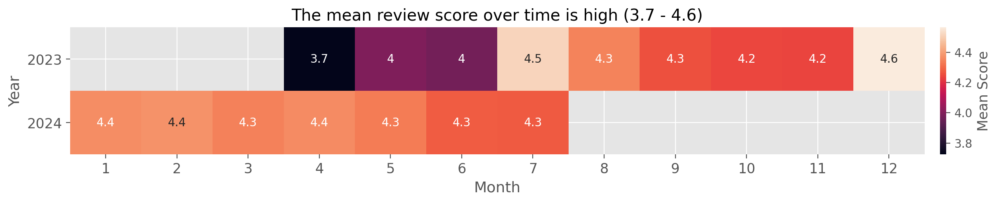

In [356]:
plt.figure(figsize=(16, 2), dpi=200)
sns.heatmap(pivot_df, annot=True, cbar_kws={'label':'Mean Score', 'pad': 0.015})
plt.title('The mean review score over time is high (3.7 - 4.6)', size=14)
plt.ylabel('Year', size=13)
plt.xlabel('Month', size=13)
plt.yticks(rotation=0, fontsize=12)
plt.xticks(rotation=0, fontsize=12)
plt.show()

<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147;">
    <strong>Key Takeaway:</strong> Starting from Jul 2023, the general trend of user rating scores is plateauing high with peaks in Jul 2023 (mean: 4.5) and Dec 2024 (mean: 46).
</div>

### **3.3 Version Analysis**
- How does user satisfaction vary across different app versions?
- Which version has the highest or lowest average score?

#### **3.3.1 Which app version received low and high rating scores?**

In [357]:
scoreby_version = (pd.crosstab(df4['reviewCreatedVersion'], df4['score'], 
                               margins=True, margins_name='Total')
                               .iloc[:-1, :])

(scoreby_version.nlargest(n=10, columns='Total')
 .style.background_gradient(cmap='YlOrRd'))

score,1,2,3,4,5,Total
reviewCreatedVersion,,,,,,
1.14.0,1246,243,344,773,11100,13706
1.19.0,1104,227,408,762,8486,10987
1.15.1,889,184,303,593,8098,10067
1.21.0,1042,211,270,609,7893,10025
1.13.0,403,104,145,366,6803,7821
1.18.1,607,152,260,446,4865,6330
1.16.1,506,110,206,337,4291,5450
1.20.2,415,85,136,292,3544,4472
1.22.0,545,92,141,285,3364,4427


<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147;">
    <strong>Key Takeaway:</strong> App version 1.14.0 is the top-rated app. And in general, all versions remain having high rates.
</div>

### **3.4 Content Analysis**
Areas: Text lengths, frequent words, n-grams, and word cloud.
- Text length to check length variability which may affect the model's ability to extract topics. Plot histograms of thee document length.
- N-grams: Explore bigrams or trigrams conveying meaningful context. Plot most frequent n-grams to understand common patterns.

#### **3.4.1 Are the review contents generally long or short?**

In [358]:
# extract review length 
df4['review_len'] = df4['content'].str.split().str.len()

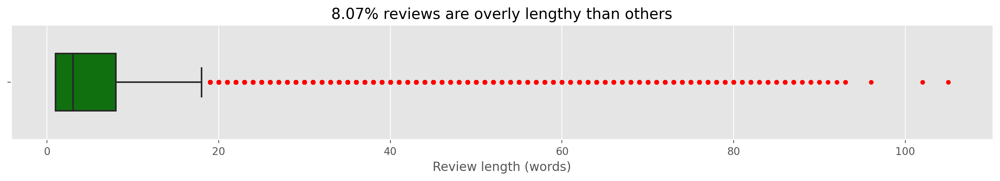

In [360]:
plt.figure(figsize=(17, 2), dpi=200)
sns.boxplot(x=df4['review_len'], color='green', width=0.5, 
            flierprops=dict(marker='.', markerfacecolor='red', 
                            markeredgecolor='red', alpha=1, 
                            markersize=7))

plt.title(f'{(num_outliers/total_rows*100):.2f}% reviews are overly lengthy than others')
plt.xlabel('Review length (words)')
plt.show()

In [359]:
Q1 = df4['review_len'].quantile(0.25)
Q3 = df4['review_len'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = df4.loc[(df4['review_len'] < lower_bound) | (df4['review_len'] > upper_bound)]
num_outliers = len(outliers)
total_rows = len(df4)

print(f"The number of outliers is {num_outliers} or {(num_outliers/total_rows*100):.2f}% of the total data ({total_rows} rows).")
display(outliers.sort_values(by='review_len', ascending=False).head())

The number of outliers is 9943 or 8.07% of the total data (123253 rows).


,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,month,year,review_len
75430,Pengguna Google,Stock Cheek Pad Dll Eps Sid Bluetooth: 1000 Ep...,2,0,NaN,2024-01-25 06:15:51,1,2024,105
6495,Pengguna Google,"Gopay sejauh ini bgs, bs d blng luar biasa , c...",4,0,1.23.0,2024-06-22 07:54:36,6,2024,102
42344,Pengguna Google,"Gw gak tau duit gw bisa balik apa nggak , gw t...",1,1,1.19.0,2024-04-04 16:24:53,4,2024,96
3179,Pengguna Google,3 hari lalu sy top up saldo ovo via apk GoPay....,1,0,NaN,2024-06-30 07:22:34,6,2024,93
55160,Pengguna Google,Mantap aplikasi anak bangsa .... Berharap gopa...,5,40,1.17.1,2024-03-09 01:48:08,3,2024,93


<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147;">
    <strong>Key Takeaway:</strong> Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.
</div>

#### **3.4.2 In what language do users leave feedback?**

In [361]:
# function to detect language
def detect_language(text):
    try:
        return detect(text) if isinstance(text, str) and len(text.strip()) > 5 else 'unknown'
    except LangDetectException:
        return 'unknown'

# apply function to detect languages
DetectorFactory.seed = 42 
start_time = time.time() 
df4['language'] = df4['content'].apply(detect_language)
end_time = time.time()
print(f'Time taken for detecting languages is {end_time - start_time:.2f} seconds')

Time taken for detecting languages is 232.08 seconds


time taken is long and inaccurate, not worthy for further analysis

In [362]:
# get percentage of language
language_percentage_tuple = list((df4['language'].value_counts(normalize=True) * 100).round(2).items())[:6]
print(language_percentage_tuple)

[('id', 63.26), ('unknown', 16.13), ('tl', 9.45), ('en', 1.54), ('so', 1.34), ('fi', 0.86)]


In [363]:
# filter tagalog
tagalog_df = df4[df4['language'] == 'tl'].sample(n=10, random_state=42)['content'].tolist()
print(tagalog_df)

['mantap', 'Klo bagus nanti aku tambah', 'Sangat baik', 'lumayan', 'Baguss banget', 'Cangih', 'Bagus banget', 'Sangat bagus', 'samgat bagus', 'mantap']


convert content ke list?

**Note**
- The language detection is not accurate enough. Many instances were detected as Tagalog instead of Indonesian. At glance, these inaccuracies are led by the short length so language detector performs poorly. Other possiblilty is the fact that the reviewers used informal variant of Indonesian which has not been sufficiently codified and trained on the language model.
- Given these inaccuracies, I will not use the feature. Column `language` will be removed from the dataset.

In [364]:
# drop col language
df4.drop(columns=['language'], inplace=True)

<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147;">
    <strong>Key Takeaway:</strong> Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.
</div>

#### **3.4.3 What are the most common words in the app reviews?**
Most common words are searched to identify what common or irrelevant words dominating the models, e.g., stop words

In [365]:
# prepare stopwords
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))
custom_stopwords = {'yang', 'aja', 'yg', 'nya', 'sih', 'oh', 'e', 'deh'}
stop_words.update(custom_stopwords)

# preprocess function
def preprocess_text(text):
    if isinstance(text, str):                                           # check if the input is a string
        text = text.lower()                                             # convert to lowercase
        text = re.sub(r'\d+', '__num__', text)                          # remove numbers
        text = re.sub(r'\W+', ' ', text)                                # remove punctuation
        text = re.sub(r'http\S+|www\S+', '__url__', text)               # remove URLs
        tokens = text.split()                                           # split into tokens
        tokens = [word for word in tokens if word not in stop_words]    # remove stopwords
        return tokens
    return []                                                           # if not string, return an empty list

# apply preprocessing
df4['tokens'] = df4['content'].apply(preprocess_text)

**Note**
- The set of stopwords in Indonesian is defined to filter out common words which lack or have no semantic content. A custom set of stopwords is also added since some discourse particles and enclitics are absent.

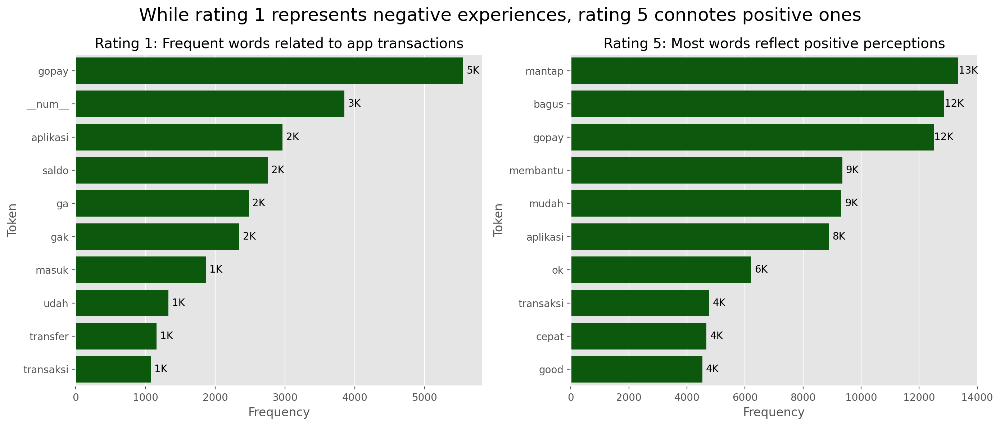

In [366]:
# Create subplots: two columns side by side
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6), dpi=200)

# Plot 1: Most frequent tokens for score 1 (on the left)
all_tokens = [token for sublist in df4[df4['score'] == 1]['tokens'] for token in sublist]
token_counts = Counter(all_tokens)
token_df = (pd.DataFrame(token_counts.items(), columns=['token', 'count'])
            .sort_values(by='count', ascending=False))

# Bar plot for score 1
sns.barplot(x='count', y='token', data=token_df.head(10), color='darkgreen', ax=axes[0])
axes[0].set_title('Rating 1: Frequent words related to app transactions', fontsize=14)
axes[0].set_xlabel('Frequency', fontsize=12)
axes[0].set_ylabel('Token', fontsize=12)

# get percentage of language
for p in axes[0].patches:
    count_value = int(p.get_width())
    label = f'{count_value // 1000}K' if count_value >= 1000 else str(count_value)
    axes[0].annotate(label, 
                     (p.get_width(), p.get_y() + p.get_height() / 2), 
                     ha='center', va='center', xytext=(10, 0), 
                     textcoords='offset points', fontsize=10)

# Plot 2: Most frequent tokens for score 5 (on the right)
all_tokens = [token for sublist in df4[df4['score'] == 5]['tokens'] for token in sublist]
token_counts = Counter(all_tokens)
token_df = (pd.DataFrame(token_counts.items(), columns=['token', 'count'])
            .sort_values(by='count', ascending=False))

# Bar plot for score 5
sns.barplot(x='count', y='token', data=token_df.head(10), color='darkgreen', ax=axes[1])
axes[1].set_title('Rating 5: Most words reflect positive perceptions', fontsize=14)
axes[1].set_xlabel('Frequency', fontsize=12)
axes[1].set_ylabel('Token', fontsize=12)

# Add frequency labels for score 5
for p in axes[1].patches:
    count_value = int(p.get_width())
    label = f'{count_value // 1000}K' if count_value >= 1000 else str(count_value)
    axes[1].annotate(label, 
                     (p.get_width(), p.get_y() + p.get_height() / 2), 
                     ha='center', va='center', xytext=(10, 0), 
                     textcoords='offset points', fontsize=10)
    
plt.suptitle('While rating 1 represents negative experiences, rating 5 connotes positive ones', size=18)
plt.tight_layout()
plt.show()

- Signifies rooms for improvement, locating the user painpoints
- Signifies the strengths of the app

<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147;">
    <strong>Key Takeaway:</strong> Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.
</div>

#### **3.4.4 What are the most frequent phrases in the reviews?**

In [367]:
score1 = df4[df4['score'] == 1]
score5 = df4[df4['score'] == 5]
filtered_score1 = score1[
    score1['content'].str.contains('gopay')
]
filtered_score5 = score5[
    score5['content'].str.contains('gopay')
]

filtered_score1.iloc[:5, 0:3]

,userName,content,score
58,Pengguna Google,Pihak gopay tak bertanggung jawap.,1
206,Pengguna Google,"Apk gopay tolol,udh di upgrade uudh brp hari b...",1
218,Pengguna Google,ini gmna aig tdak bisa asup gopayu😭😭,1
228,Pengguna Google,Saya tiap top up gopay gk masuk masuk kadang h...,1
240,Pengguna Google,gilakah upgrade gopay plus gagal mulu padahal ...,1


In [368]:
# Initialize CountVectorizer for n-grams
bigram_vectorizer = CountVectorizer(ngram_range=(2, 2), token_pattern=r'\b\w+\b')
trigram_vectorizer = CountVectorizer(ngram_range=(3, 3), token_pattern=r'\b\w+\b')
bigram_X = bigram_vectorizer.fit_transform(filtered_score1['content'])
trigram_X = trigram_vectorizer.fit_transform(filtered_score1['content'])

# Get n-gram counts
bigram_counts = bigram_X.toarray().sum(axis=0)
trigram_counts = trigram_X.toarray().sum(axis=0)
bigram_names = bigram_vectorizer.get_feature_names_out()
trigram_names = trigram_vectorizer.get_feature_names_out()

# Create a DataFrame for n-grams and their counts
bigram_df = pd.DataFrame({'ngram': bigram_names, 'count': bigram_counts})
bigram_df = bigram_df[bigram_df['count'] > 0].sort_values(by='count', ascending=False)

trigram_df = pd.DataFrame({'ngram': trigram_names, 'count': trigram_counts})
trigram_df = trigram_df[trigram_df['count'] > 0].sort_values(by='count', ascending=False)

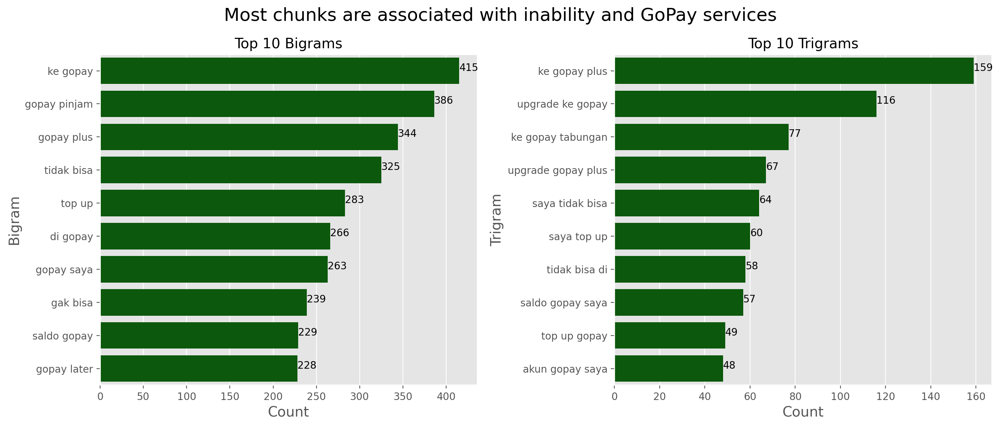

In [369]:
# create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=200)

# plot for bigrams
sns.barplot(x='count', y='ngram', data=bigram_df.head(10), 
            ax=axes[0], color='darkgreen')
for index, value in enumerate(bigram_df.head(10)['count']):
    axes[0].text(value, index, str(value))
axes[0].set_title('Top 10 Bigrams', fontsize=14)
axes[0].set_xlabel('Count', fontsize=14)
axes[0].set_ylabel('Bigram', fontsize=14)

# plot for trigrams
sns.barplot(x='count', y='ngram', data=trigram_df.head(10), 
            ax=axes[1], color='darkgreen')
for index, value in enumerate(trigram_df.head(10)['count']):
    axes[1].text(value, index, str(value))
axes[1].set_title('Top 10 Trigrams', fontsize=14)
axes[1].set_xlabel('Count', fontsize=14)
axes[1].set_ylabel('Trigram', fontsize=14)
plt.suptitle('Most chunks are associated with inability and GoPay services', 
             size=18)
plt.tight_layout()
plt.show()

In [370]:
# filter dataset: score 1 only and containing gopay plus
gopayplus_df = df4[(df4['score'] == 1) & (df4['content'].str.contains('gopay plus'))]

# display result
print(f'Total instances: {len(gopayplus_df)}')
gopayplus_df.iloc[:6,0:5]

Total instances: 318


,userName,content,score,thumbsUpCount,reviewCreatedVersion
240,Pengguna Google,gilakah upgrade gopay plus gagal mulu padahal ...,1,0,1.26.1
250,Pengguna Google,ini eror apa gimana ya pas undang temen pertam...,1,0,NaN
1022,Pengguna Google,"saya mau ambil uang saya, DIPERSULIT! disuruh ...",1,0,NaN
1038,Pengguna Google,Gak jelas banget ! Saat upgrade ke gopay plus ...,1,1,1.24.1
1336,Pengguna Google,saya sudah seminggu lebih daftar akun gopay da...,1,0,1.24.1
1607,Pengguna Google,Aplikasi aneh baru topup malah gabisa buat tra...,1,0,1.24.1


In [371]:
# get top-5 comments with the highest thums up count
(df4[df4['score'] == 1]
 .nlargest(n=5, columns='thumbsUpCount')
 .loc[:, ['userName', 'content', 'score', 'reviewCreatedVersion', 'thumbsUpCount']])

,userName,content,score,reviewCreatedVersion,thumbsUpCount
47782,Pengguna Google,Aplikasi yg dengan gampangnya mudah ke lock un...,1,1.18.1,1748
100595,Pengguna Google,"Padahal udah cukup lama pakek gopay, eh pas ad...",1,1.12.1,1559
63870,Pengguna Google,1. Aplikasi pengamannya minim. Pas buka aplika...,1,1.15.1,872
84181,Pengguna Google,"Saya kira aplikasinya sudah bagus, tapi fasili...",1,1.14.0,860
33134,Pengguna Google,kenapa setiap kali mau tarik tunai prosesnya l...,1,1.19.0,857


In [372]:
# Initialize CountVectorizer for n-grams
bigram_vectorizer = CountVectorizer(ngram_range=(2, 2), token_pattern=r'\b\w+\b')
trigram_vectorizer = CountVectorizer(ngram_range=(3, 3), token_pattern=r'\b\w+\b')
bigram_X = bigram_vectorizer.fit_transform(filtered_score5['content'])
trigram_X = trigram_vectorizer.fit_transform(filtered_score5['content'])

# Get n-gram counts
bigram_counts = bigram_X.toarray().sum(axis=0)
trigram_counts = trigram_X.toarray().sum(axis=0)
bigram_names = bigram_vectorizer.get_feature_names_out()
trigram_names = trigram_vectorizer.get_feature_names_out()

# Create a DataFrame for n-grams and their counts
bigram_df = pd.DataFrame({'ngram': bigram_names, 'count': bigram_counts})
bigram_df = bigram_df[bigram_df['count'] > 0].sort_values(by='count', ascending=False)

trigram_df = pd.DataFrame({'ngram': trigram_names, 'count': trigram_counts})
trigram_df = trigram_df[trigram_df['count'] > 0].sort_values(by='count', ascending=False)

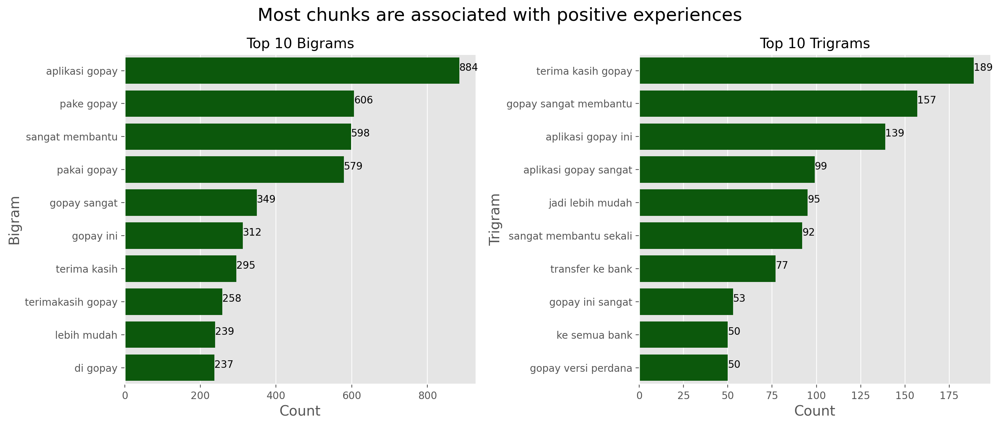

In [373]:
# create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=200)

# plot for bigrams
sns.barplot(x='count', y='ngram', data=bigram_df.head(10), 
            ax=axes[0], color='darkgreen')
for index, value in enumerate(bigram_df.head(10)['count']):
    axes[0].text(value, index, str(value))
axes[0].set_title('Top 10 Bigrams', fontsize=14)
axes[0].set_xlabel('Count', fontsize=14)
axes[0].set_ylabel('Bigram', fontsize=14)

# plot for trigrams
sns.barplot(x='count', y='ngram', data=trigram_df.head(10), 
            ax=axes[1], color='darkgreen')
for index, value in enumerate(trigram_df.head(10)['count']):
    axes[1].text(value, index, str(value))
axes[1].set_title('Top 10 Trigrams', fontsize=14)
axes[1].set_xlabel('Count', fontsize=14)
axes[1].set_ylabel('Trigram', fontsize=14)
plt.suptitle('Most chunks are associated with positive experiences', 
             size=18)
plt.tight_layout()
plt.show()

<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147;">
    <strong>Key Takeaway:</strong> Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.
</div>

### **3.5 User Analysis**

#### **3.5.1 Are there any patterns in the reviewers?**

In [374]:
# Get the top users for score 1 and score 5
rating_score1 = (df4[df4['score'] == 1]['userName']
                 .value_counts(normalize=True)
                 .reset_index()
                 .round(4)
                 .head(10))
rating_score1['userName'] = rating_score1['userName'].apply(lambda x: x.lower())
rating_score1.columns = ['userName', 'percent']

rating_score5 = (df4[df4['score'] == 5]['userName']
                 .value_counts(normalize=True)
                 .reset_index()
                 .round(4)
                 .head(10))
rating_score5['userName'] = rating_score5['userName'].apply(lambda x: x.lower())
rating_score5.columns = ['userName', 'percent']

# convert percentages 100
rating_score1['percent'] *= 100
rating_score5['percent'] *= 100

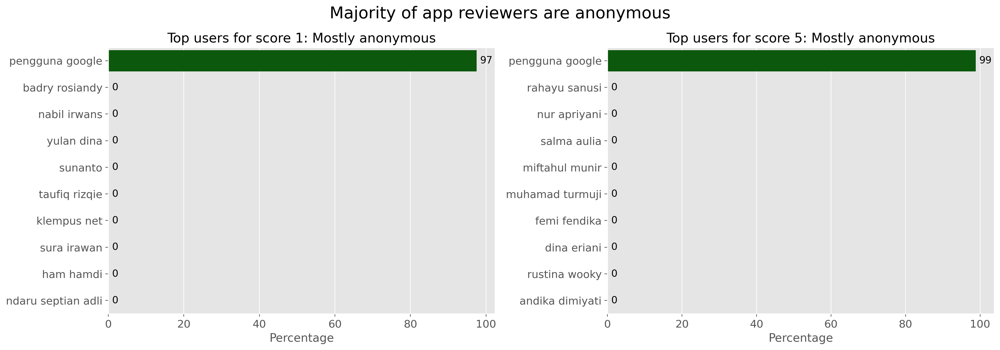

In [375]:
# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(17, 6), dpi=200)

# Horizontal bar plot for score 1
sns.barplot(x='percent', y='userName', data=rating_score1, 
            ax=axes[0], color='darkgreen')
axes[0].set_title('Top users for score 1: Mostly anonymous', fontsize=16)
axes[0].set_xlabel('Percentage', fontsize=14)
axes[0].set_ylabel(None)
for index, value in enumerate(rating_score1['percent']):
    axes[0].text(value + 1, index, f'{value:.0f}', va='center', fontsize=12)
axes[0].tick_params(axis='y', labelsize=13)  
axes[0].tick_params(axis='x', labelsize=13)  

# Horizontal bar plot for score 5
sns.barplot(x='percent', y='userName', data=rating_score5, 
            ax=axes[1], color='darkgreen')
axes[1].set_title('Top users for score 5: Mostly anonymous', fontsize=16)
axes[1].set_xlabel('Percentage', fontsize=14)
axes[1].set_ylabel(None)
for index, value in enumerate(rating_score5['percent']):
    axes[1].text(value + 1, index, f'{value:.0f}', va='center', fontsize=12)
axes[1].tick_params(axis='y', labelsize=13)
axes[1].tick_params(axis='x', labelsize=13)

plt.suptitle('Majority of app reviewers are anonymous', size=20)
plt.tight_layout()
plt.show()

<div style="border-left: 4px solid #36C; padding: 0.5em; background-color: #002147;">
    <strong>Key Takeaway:</strong> Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.
</div>

## **4 Topic Modeling**

- Raw Word Frequencies:
    - Definition: This approach counts how often each word appears in a document or set of documents.
    - Output: Produces a list of words along with their counts or frequencies.
    - Limitations: Does not provide context or relationships between words. It can't capture themes or topics because it treats words in isolation.
- Topic Modeling:
    - Definition: A more advanced technique that identifies hidden themes or topics within a collection of texts by analyzing the co-occurrence of words.
    - Output: Generates a set of topics, each represented by a distribution of words that frequently occur together, along with the documents associated with each topic.
    - Advantages: Reveals the underlying structure of the text data, allowing for insights into the main themes, which helps in understanding context and relationships between concepts.

### **4.1 Latent Dirichlet Allocation (LDA)**
**Note**: Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.

#### **4.1.1 How LDA works**
**Note**: Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.

```python
# Pseudocode for LDA Topic Modeling
def LDA(D, K, alpha, beta, iterations):
    # Step 1: Initialize variables
    topics_per_doc = initialize_random(D, K)  # Randomly assign topics to each word
    words_per_topic = count_word_topic_assignments(D, K)
    topics_in_docs = count_topic_assignments_in_documents(D, K)
    
    for iter in range(iterations):
        for doc in D:
            for word in doc:
                current_topic = topics_per_doc[doc][word]

                # Step 2: Remove the current topic assignment
                topics_per_doc[doc][word] = None
                words_per_topic[current_topic][word] -= 1
                topics_in_docs[doc][current_topic] -= 1
                
                # Step 3: Compute the topic distribution probabilities
                topic_probs = []
                for topic in range(K):
                    p_topic_given_doc = (topics_in_docs[doc][topic] + alpha)/ 
                    (sum(topics_in_docs[doc]) + K * alpha)
                    p_word_given_topic = (words_per_topic[topic][word] + beta)/
                    (sum(words_per_topic[topic]) + len(vocab) * beta)
                    topic_probs.append(p_topic_given_doc * p_word_given_topic)
                
                # Step 4: Sample a new topic based on probabilities
                new_topic = sample_from_distribution(topic_probs)
                
                # Step 5: Update the counts with the new topic
                topics_per_doc[doc][word] = new_topic
                words_per_topic[new_topic][word] += 1
                topics_in_docs[doc][new_topic] += 1
    
    # Step 6: Return the topic distributions for documents and words
    document_topic_distribution = compute_document_topic_distribution(topics_in_docs, alpha)
    topic_word_distribution = compute_topic_word_distribution(words_per_topic, beta)
    
    return document_topic_distribution, topic_word_distribution
```

#### **4.1.2 Grid search of ideal topic number**

In [376]:
# create a dictionary and corpus for LDA
dictionary = corpora.Dictionary(df4['tokens'])
corpus = [dictionary.doc2bow(tokens) for tokens in df4['tokens'] if tokens]  # Filter out empty lists

**Note**: Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.

In [377]:
# search for optimal number of topics
topics_range = range(2, 11)  
coherence_scores = []
timing_info = []

for num_topics in topics_range:
    start_time = time.time() 
    # train the LDA model
    print(f'Training model with {num_topics} topics...')
    lda_model = LdaModel(corpus=corpus, 
                         num_topics=num_topics, 
                         id2word=dictionary, 
                         passes=20,
                         random_state=42)
    # compute coherence score
    coherence_model = CoherenceModel(model=lda_model, texts=df4['tokens'],
                                    dictionary=dictionary, coherence='c_v')
    coherence_score = coherence_model.get_coherence()
    coherence_scores.append(coherence_score)

    end_time = time.time() 
    elapsed_time = end_time - start_time
    timing_info.append(elapsed_time)
    print(f'> Num of topics: {num_topics}, coherence score: {coherence_score:.4f}, training time: {elapsed_time:.2f} seconds')

Training model with 2 topics...
> Num of topics: 2, coherence score: 0.5351, training time: 138.87 seconds
Training model with 3 topics...
> Num of topics: 3, coherence score: 0.5209, training time: 145.68 seconds
Training model with 4 topics...
> Num of topics: 4, coherence score: 0.5309, training time: 139.67 seconds
Training model with 5 topics...
> Num of topics: 5, coherence score: 0.5497, training time: 378.99 seconds
Training model with 6 topics...
> Num of topics: 6, coherence score: 0.5342, training time: 145.28 seconds
Training model with 7 topics...
> Num of topics: 7, coherence score: 0.5229, training time: 149.04 seconds
Training model with 8 topics...
> Num of topics: 8, coherence score: 0.4851, training time: 569.06 seconds
Training model with 9 topics...
> Num of topics: 9, coherence score: 0.5007, training time: 146.78 seconds
Training model with 10 topics...
> Num of topics: 10, coherence score: 0.5041, training time: 140.96 seconds


In [408]:
mean_cs = np.mean(coherence_scores)
sd_cs = np.std(coherence_scores)
print(f'Mean of coherence scores: {mean_cs:.4f} ± {sd_cs:.4f}')

Mean of coherence scores: 0.5204 ± 0.0191


In [378]:
# Choose the optimal number of topics based on the highest coherence score
optimal_num_topics = topics_range[np.argmax(coherence_scores)]
print(f'Optimal Number of Topics: {optimal_num_topics}')

Optimal Number of Topics: 5


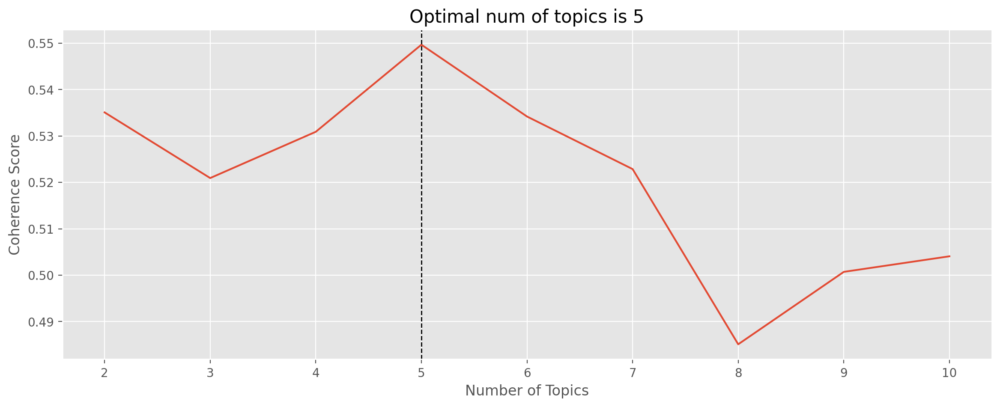

In [397]:
# Plot the coherence scores
plt.figure(figsize=(14, 5), dpi=200)
plt.plot(topics_range, coherence_scores)
plt.axvline(x=optimal_num_topics, linestyle='--', color='black', linewidth=1)
plt.xticks(range(2, 11, 1))
# plt.yticks(np.arange(0, 0.8, 0.2))
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.title(f'Optimal num of topics is {optimal_num_topics}', size=15)
plt.show()

**Note**: Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.

#### **4.1.3 Training LDA Model**

In [415]:
# Train LDA model with the optimal number of topics
start_time = time.time()
lda_model = LdaModel(corpus=corpus, 
                     num_topics=optimal_num_topics, 
                     id2word=dictionary, 
                     passes=20)
end_time = time.time()
print(f'Time taken for model training: {end_time - start_time:.2f} seconds')

In [416]:
# compute coherence score
coherence_model = CoherenceModel(model=lda_model, texts=df4['tokens'], 
                                 dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()
# calculate perplexity
perplexity = lda_model.log_perplexity(corpus)

# Convert log perplexity to perplexity
perplexity_value = np.exp(-perplexity)

print(f'Coherence Score: {coherence_score:.4f}')
print(f'Perplexity: {perplexity_value:.4f}')

Coherence Score: 0.5287
Perplexity: 1368.9224


#### **Hyperparameter Tuning**

In [417]:
from sklearn.model_selection import ParameterGrid

param_grid = {
    'alpha': ['auto', 0.01, 0.1, 1.0],
    'beta': ['auto', 0.01, 0.1, 1.0],
    # 'passes': [10, 15, 20],
    'iterations': [100, 200]
}

grid = ParameterGrid(param_grid)

In [ ]:
best_coherence = -1
best_params = {}

for params in grid:
    start_time = time.time()
    # train the LDA model 
    tuned_lda_model = LdaModel(corpus=corpus,
                         num_topics=optimal_num_topics,
                         id2word=dictionary,
                         alpha=params['alpha'],
                        #  beta=params['beta'],
                         passes=30,
                         iterations=params['iterations'],
                         random_state=42)
    # calculate coherence score
    coherence_model = CoherenceModel(model=tuned_lda_model, texts=df4['tokens'], dictionary=dictionary, coherence='c_v')
    coherence_score = coherence_model.get_coherence()
    
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"Params: {params}, Coherence Score: {coherence_score:.4f}, Time Taken: {elapsed_time:.2f} seconds")
    
    # update the best score and parameters
    if coherence_score > best_coherence:
        best_coherence = coherence_score
        best_params = params

print(f"Best Coherence Score: {best_coherence:.4f} with params: {best_params}")

In [381]:
# display the top 10 words for each topic
for idx, topic in lda_model.show_topics(num_topics=5, num_words=10, formatted=False):
    print(f"Topic {idx}:")
    print([word for word, _ in topic])
    print()

Topic 0:
['gopay', 'aplikasi', 'gojek', 'bayar', 'pulsa', 'pake', 'kota', 'beli', 'pembayaran', 'pakai']

Topic 1:
['gopay', '__num__', 'gak', 'ga', 'aplikasi', 'udah', 'saldo', 'kasih', 'ya', 'bintang']

Topic 2:
['bagus', 'aplikasi', 'good', 'aplikasinya', 'transfer', 'keren', 'gratis', 'banget', 'memudahkan', 'semoga']

Topic 3:
['mudah', 'membantu', 'ok', 'cepat', 'transaksi', 'aplikasi', 'banget', 'gampang', 'aman', 'oke']

Topic 4:
['mantap', 'top', 'up', 'digital', 'berguna', 'dompet', 'mantab', 'aplikasi', 'puas', 'lumayan']



In [382]:
pd.options.display.max_colwidth=None

# Extract the topics and their word distributions from the LDA model
topics_data = lda_model.show_topics(formatted=False)

# Prepare a list to store formatted topics
formatted_topics = []
for idx, topic in topics_data:
    formatted_topic = ', '.join([f"({word}, {weight:.2f})" for word, weight in topic])
    formatted_topics.append((idx, formatted_topic))

# Create a DataFrame
topics_df = pd.DataFrame(formatted_topics, columns=['n_topic', 'top_words'])
display(topics_df)

,n_topic,top_words
0,0,"(gopay, 0.13), (aplikasi, 0.04), (gojek, 0.03), (bayar, 0.02), (pulsa, 0.02), (pake, 0.02), (kota, 0.02), (beli, 0.02), (pembayaran, 0.02), (pakai, 0.02)"
1,1,"(gopay, 0.03), (__num__, 0.03), (gak, 0.02), (ga, 0.02), (aplikasi, 0.02), (udah, 0.01), (saldo, 0.01), (kasih, 0.01), (ya, 0.01), (bintang, 0.01)"
2,2,"(bagus, 0.15), (aplikasi, 0.05), (good, 0.04), (aplikasinya, 0.04), (transfer, 0.04), (keren, 0.04), (gratis, 0.03), (banget, 0.03), (memudahkan, 0.03), (semoga, 0.02)"
3,3,"(mudah, 0.12), (membantu, 0.10), (ok, 0.05), (cepat, 0.04), (transaksi, 0.04), (aplikasi, 0.04), (banget, 0.04), (gampang, 0.03), (aman, 0.02), (oke, 0.02)"
4,4,"(mantap, 0.20), (top, 0.06), (up, 0.04), (digital, 0.02), (berguna, 0.02), (dompet, 0.02), (mantab, 0.02), (aplikasi, 0.02), (puas, 0.01), (lumayan, 0.01)"


- Topic 0: This topic appears to focus on the use of GoPay as a payment application for transactions such as buying pulsa (top-up credits) and making payments in various kota (cities). It suggests discussions around using the app for daily purchases.
- Topic 1: This topic seems to address issues or opinions about the GoPay application, particularly the user experience with saldo (balance). The presence of "gak" (no/not) and "udah" (already) may imply negative sentiments or concerns about the app's functionality, possibly discussing insufficient balance or issues encountered.
- Topic 2: This topic reflects positive sentiments about the application. Words like "bagus" (good), "gratis" (free), and "memudahkan" (makes easier) indicate that users appreciate the app's features and functionality, particularly concerning transfers.
- Topic 3: This topic also highlights a positive experience with the app, emphasizing its ease of use (e.g., "mudah" - easy, "cepat" - fast, "aman" - safe). Users seem to find the app efficient for conducting transactions.
- Topic 4: This topic might focus on the overall satisfaction with the app and its features. Words like "mantap" (great) and "puas" (satisfied) indicate users find the app useful for managing their digital wallet or dompet (wallet).
- General:  the topics can be clustered around user experience, functionality, and sentiment regarding the GoPay application.

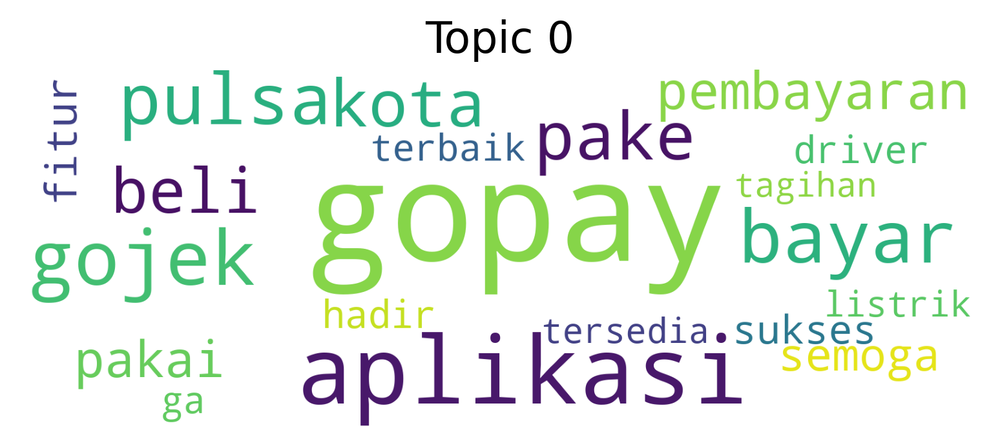

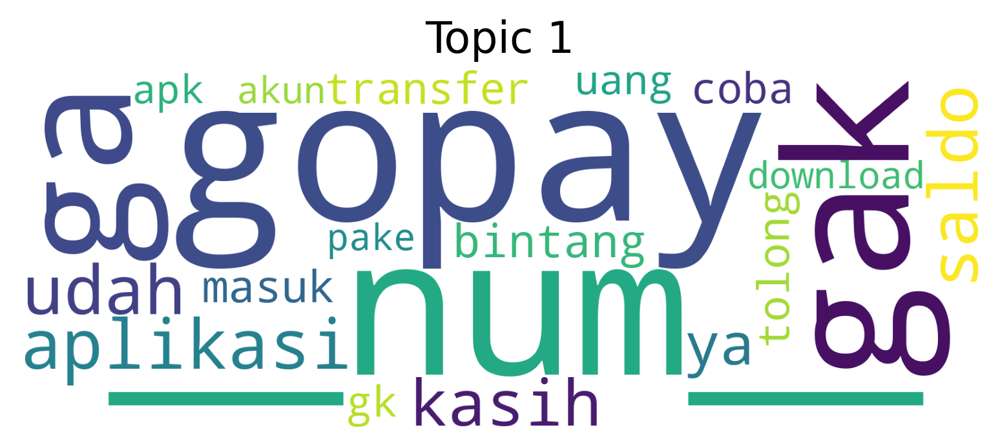

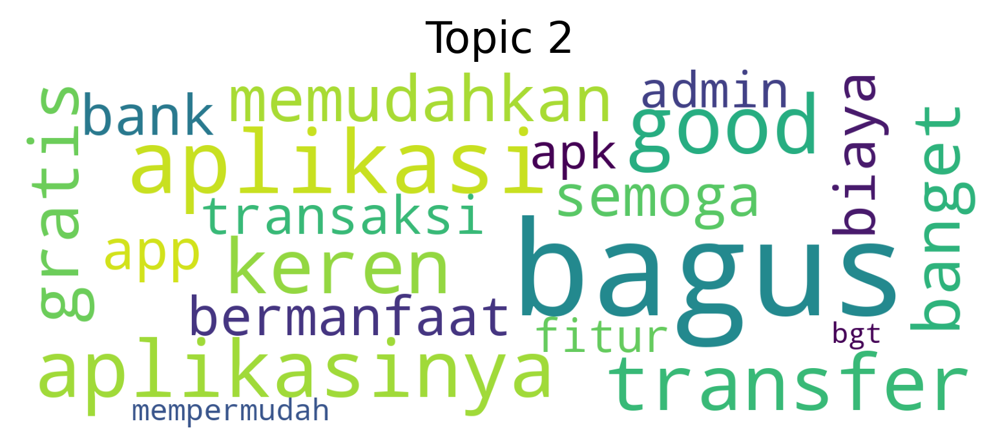

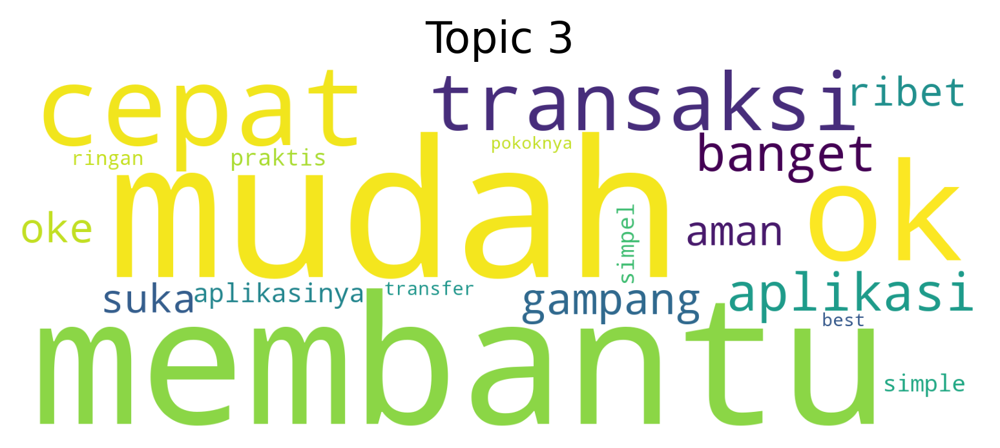

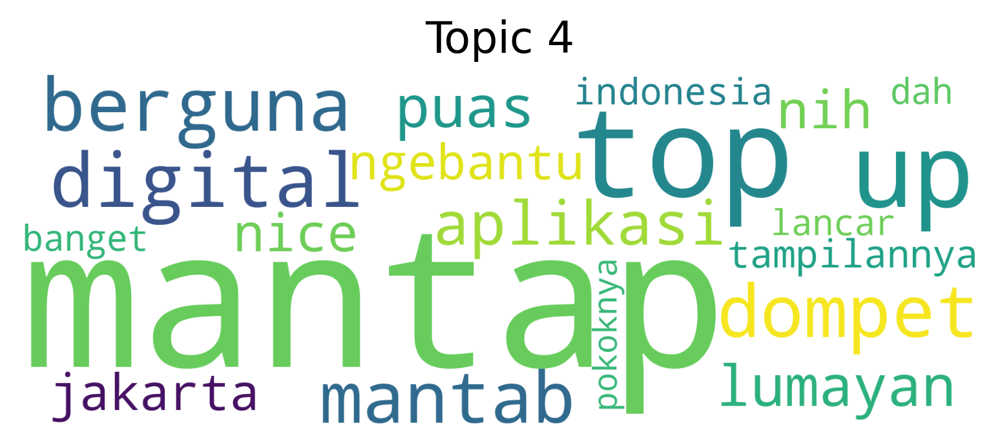

In [383]:
# Generate word clouds for each topic
for idx in range(lda_model.num_topics):
    plt.figure(dpi=300)  # Increased DPI
    wordcloud = WordCloud(width=1600, height=600, background_color='white')\
                .fit_words(dict(lda_model.show_topic(idx, topn=20)))
    
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(f'Topic {idx}', size=16)
    
    # Save the figure instead of showing it
    plt.show()

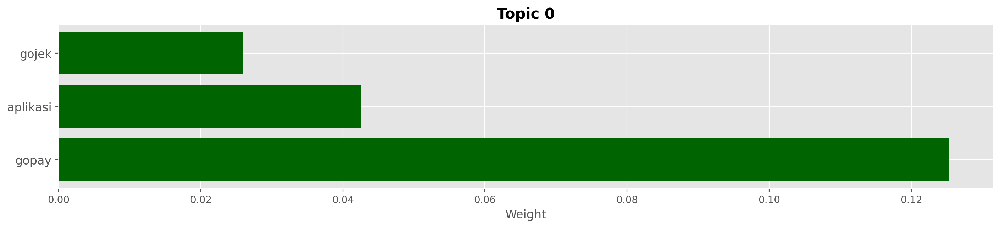

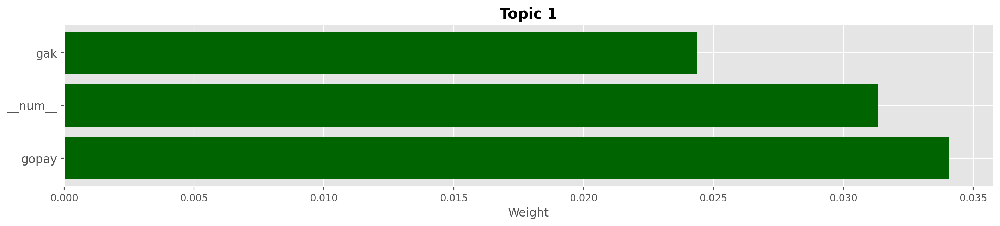

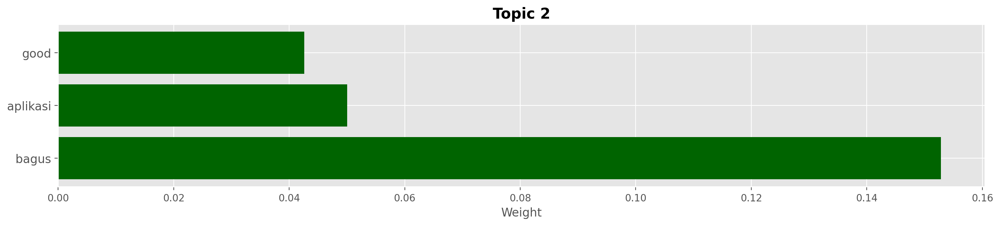

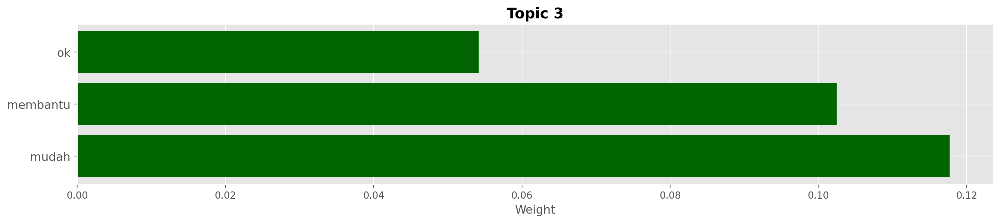

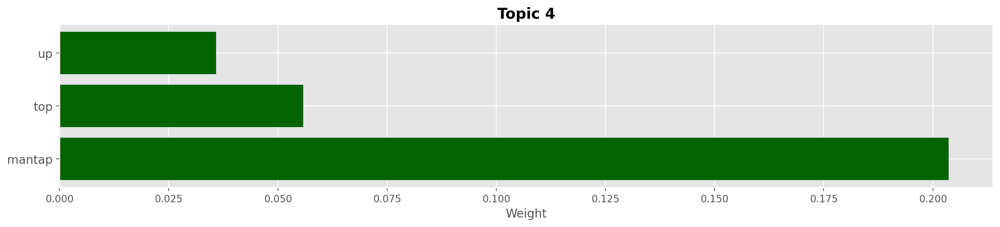

In [384]:
# Function to plot top words for each topic
def plot_top_words(model, num_words=3):
    for idx in range(model.num_topics):
        plt.figure(figsize=(17, 3), dpi=200)
        words = model.show_topic(idx, topn=num_words)
        words, weights = zip(*words)
        plt.barh(words, weights, color='darkgreen')
        plt.yticks(fontsize=12)
        plt.xlabel('Weight', size=12)
        plt.title(f'Topic {idx}', size=15, fontweight='bold')
        plt.show()

plot_top_words(lda_model)

In [385]:
# prepare data 
topic_distribution = np.zeros((len(df4), lda_model.num_topics))
for i, item in enumerate(corpus):
    if item:
        topic_info = lda_model.get_document_topics(item)
        for topic_id, prob in topic_info:
            topic_distribution[i, topic_id] = prob

topic_df = pd.DataFrame(topic_distribution, 
                        columns=[f'Topic {i}' for i in range(lda_model.num_topics)])

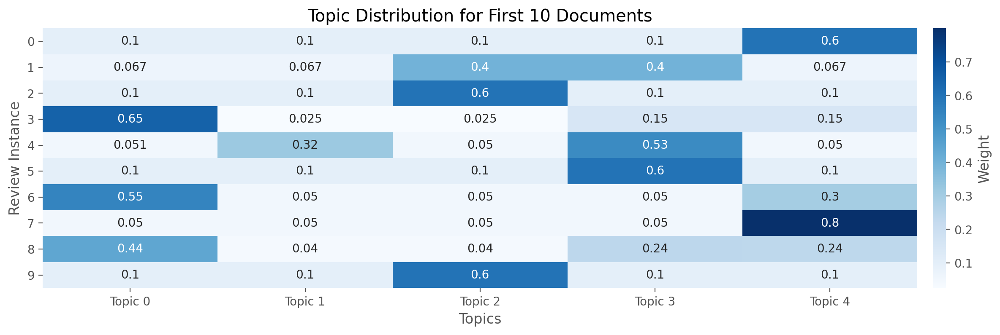

In [386]:
# visualize topic distribution for top-10 instance
plt.figure(figsize=(16, 4), dpi=200)
sns.heatmap(topic_df.iloc[:10], cmap='Blues', annot=True, cbar_kws={'label': 'Weight', 'pad': 0.015})
plt.title('Topic Distribution for First 10 Documents')
plt.ylabel('Review Instance')
plt.xlabel('Topics')
plt.yticks(rotation=0)
plt.show()

**Note**: Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.

In [389]:
# Initialize topics with default value (-1 for unclassified)
df4['topic'] = -1
# Loop over each document and assign the most probable topic
for i, doc_bow in enumerate(corpus):
    if doc_bow:  # Only proceed if document is not empty
        topic_distribution = lda_model.get_document_topics(doc_bow)
        # Assign the topic with the highest probability to the 'topic' column
        if topic_distribution:
            df4.at[i, 'topic'] = max(topic_distribution, key=lambda x: x[1])[0]

# Display the updated df4
display(df4.head())

,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,month,year,review_len,tokens,topic
0,Pengguna Google,Mantap,5,0,1.24.1,2024-07-07 16:58:06,7,2024,1,[mantap],4
1,Pengguna Google,Bagus dan mudah digunakan,5,0,1.24.1,2024-07-07 16:57:08,7,2024,4,"[bagus, mudah]",2
2,Pengguna Google,Good,5,0,1.24.1,2024-07-07 16:52:38,7,2024,1,[good],2
3,Pengguna Google,Sangat membantu orang menengah mantap semoga sukses terus gopay,5,0,1.24.1,2024-07-07 16:52:36,7,2024,9,"[membantu, orang, menengah, mantap, semoga, sukses, gopay]",0
4,Pengguna Google,Ga ribet .. Sukaaaa,5,0,1.24.1,2024-07-07 16:52:09,7,2024,4,"[ga, ribet, sukaaaa]",3


In [387]:
# apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
reduced_data = tsne.fit_transform(topic_distribution)

pindah ke bagian content analysis saja

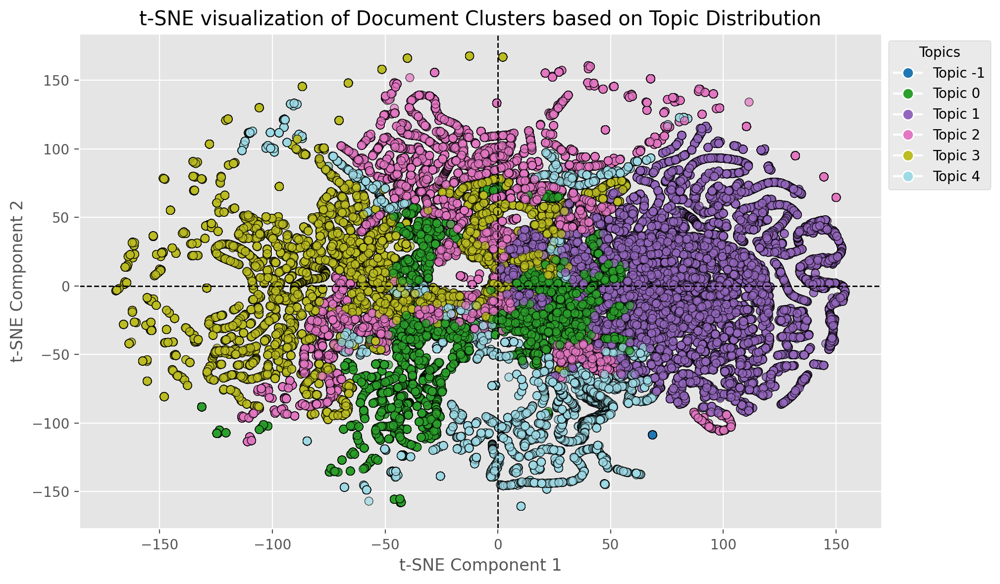

In [390]:
# Get unique topics and sort them
unique_topics = np.sort(df4['topic'].unique())

# Create a scatter plot
plt.figure(figsize=(12, 6), dpi=200)
scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], 
                      c=df4['topic'], cmap='tab20', edgecolor='k', alpha=0.7)
plt.axhline(0, color='k', linestyle='--', linewidth=1)
plt.axvline(0, color='k', linestyle='--', linewidth=1)
plt.title('t-SNE visualization of Document Clusters based on Topic Distribution')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')

# add custom legend
handles = [plt.Line2D([0], [0], marker='o', color='w', 
                      markerfacecolor=scatter.cmap(scatter.norm(topic)), 
                      markersize=8, label=f'Topic {int(topic)}') for topic in unique_topics]

plt.legend(handles=handles, title="Topics", bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.show()

The plot clearly shows the formation of distinct clusters, suggesting that the topic model effectively groups documents with similar thematic content.
The clusters are relatively well-separated, indicating that the topics are reasonably distinct from one another.

Some overlap between clusters suggests that there are shared characteristics or similarities among certain topics, which is common in real-world data.
There are a few points that appear to be outliers, located outside the main clusters. These might represent documents that do not fit cleanly into any of the defined topics or might be artifacts of the t-SNE algorithm.

pelajari t-SNE untuk apa dan bagaimana cara kerjanya. Apa bedanya dengan PCA

```python
# apply t-SNE with 3 components
start_time = time.time()
tsne = TSNE(n_components=3, random_state=42)
reduced_data = tsne.fit_transform(topic_distribution)
end_time = time.time() 
print(f'Time taken for training t-SNE model: {end_time - start_time:.2f}')
```

```python
# get unique topics and sort them
unique_topics = np.sort(df4['topic'].unique())

# create a 3D scatter plot
fig = plt.figure(figsize=(10, 7), dpi=200)
ax = fig.add_subplot(111, projection='3d')

# plot the points
scatter = ax.scatter(reduced_data[:, 0], reduced_data[:, 1], reduced_data[:, 2], 
                     c=df4['topic'], cmap='tab20', edgecolor='k', alpha=0.7)
ax.set_title('t-SNE 3D visualization of Document Clusters based on Topic Distribution')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')

handles = [plt.Line2D([0], [0], marker='o', color='w', 
                      markerfacecolor=scatter.cmap(scatter.norm(topic)), 
                      markersize=8, label=f'Topic {int(topic)}') for topic in unique_topics]
plt.legend(handles=handles, title="Topics", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.show()
```

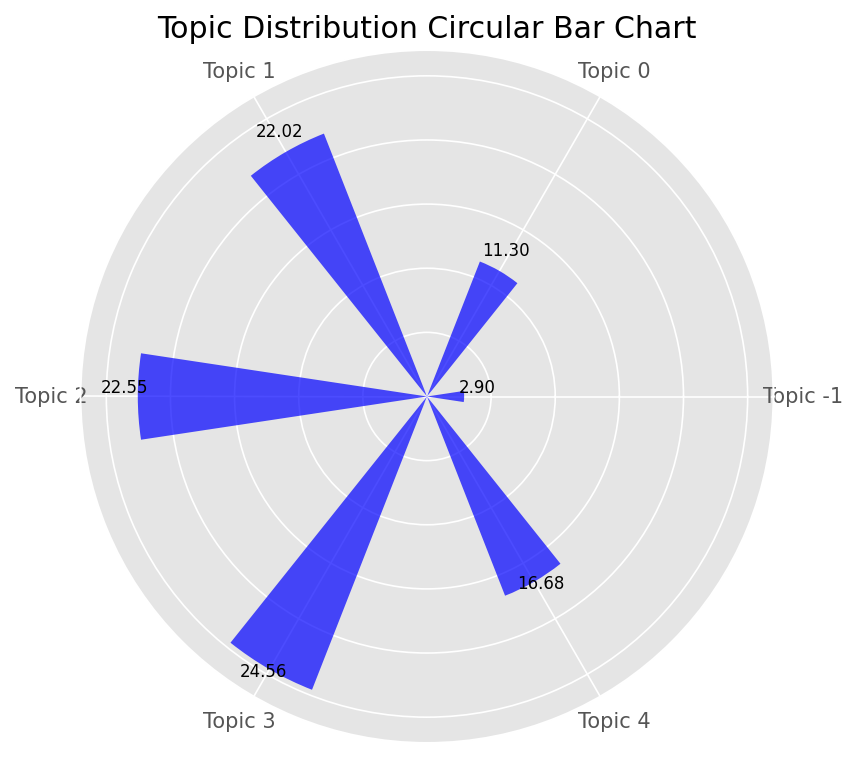

In [391]:
# Calculate topic distribution as percentages
topic_distribution = (df4['topic'].value_counts(normalize=True) * 100).sort_index()

# Prepare data for circular bar chart
labels = [f'Topic {int(topic)}' for topic in topic_distribution.index]
values = topic_distribution.values
num_vars = len(labels)

# Create an array of angles for each bar
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# Repeat the first value to close the circle
values = np.concatenate((values, [values[0]]))
angles += angles[:1]

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True), dpi=150)

# Draw bars
bars = ax.bar(angles[:-1], values[:-1], color='b', alpha=0.7, width=0.3)

# Add labels to the bars
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Customize the radial limits
ax.set_ylim(0, max(values) * 1.1)

# Disable y-tick labels while keeping the ticks
ax.set_yticklabels([])  # Set y-tick labels to an empty list

# Add title
plt.title('Topic Distribution Circular Bar Chart')

# Add labels above each bar
label_size = 12  # Adjust this value to change the label size
for i in range(len(values) - 1):
    ax.text(angles[i], values[i] + 1, f'{values[i]:.2f}', ha='center', va='bottom', size=8)

# Show plot
plt.show()

In [29]:
display((df4['topic'].value_counts(normalize=True)*100).to_frame().round(2).sort_index().transpose())
display((df4['topic'].value_counts()).to_frame().round(2).sort_index().transpose())

topic,-1,0,1,2,3
proportion,2.93,19.44,21.59,30.21,25.83


topic,-1,0,1,2,3
count,3614,23955,26614,37238,31832


In [30]:
df4[df4['topic']==-1].sample(n=5, random_state=42)

,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,tokens,topic
122923,Ridho Fernando,"Saya sama kek abg fazri tunggu hadir di kota anda katanya .saya tunggu"" tidak juga bisa berbeda dengan dana tidak ada seperti itu . Tpi gopay ini mempersulit yg ingin menggunakan nya ah jadi mls gue dgn gopay ni.aku kasih bintang 1 aj dlu",1,1,1.0.2,2023-05-02 13:20:47,"[kek, abg, fazri, tunggu, hadir, kota, tunggu, berbeda, dana, tpi, gopay, mempersulit, ah, mls, gue, dgn, gopay, ni, kasih, bintang, aj, dlu]",-1
123212,Gibran Iban,Asliii aku mah tim yang beneran exited sama aplikasi ini yah mantap soalnya,5,1,NaN,2023-04-12 12:49:07,"[asliii, mah, tim, beneran, exited, aplikasi, yah, mantap]",-1
121464,Pengguna Google,Apk nya di jamin aman dan fiturnya bagus buat transaksi aman dan tanpa pemotongan,5,1,NaN,2023-06-24 07:44:43,"[apk, jamin, aman, fiturnya, bagus, transaksi, aman, pemotongan]",-1
123213,Rezky bs,Aplikasi jelek tidak berguna habisin kuota aja buat download tidak bisa digunakan,1,4,1.0.0,2023-04-12 12:13:26,"[aplikasi, jelek, berguna, habisin, kuota, download]",-1
122768,Iim Ibrahim,"Alhamdulillah ga lemot app nya, sejauh ini aman pake dan fiturnya lebih lengkap",5,1,NaN,2023-05-08 13:52:58,"[alhamdulillah, ga, lemot, app, aman, pake, fiturnya, lengkap]",-1


In [393]:
from gensim.models.coherencemodel import CoherenceModel

# Compute coherence score
coherence_model = CoherenceModel(model=lda_model, texts=df4['tokens'], 
                                 dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()
print(f'Coherence Score: {coherence_score:.4f}')

Coherence Score: 0.5373


The coherence score measures the degree of semantic similarity between high-scoring words in each topic. It ranges from 0 to 1, with higher scores indicating better topic quality. A score of 0.5373 suggests that the topics are moderately coherent. This means that the words in each topic are somewhat related and can collectively convey a clear theme or meaning.

Perplexity is a measure of how well the probability distribution predicted by the model aligns with the observed data. Lower perplexity indicates a better fit to the data.

In [392]:
# palculate perplexity
perplexity = lda_model.log_perplexity(corpus)

# Convert log perplexity to perplexity
perplexity_value = np.exp(-perplexity)

print(f'Perplexity: {perplexity_value:.4f}')

Perplexity: 1340.5662


### visualizing the topic distributions over time or by user demographics to gain deeper insights

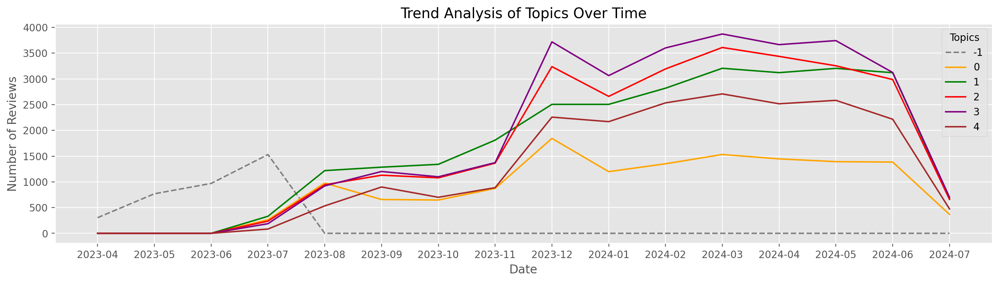

In [396]:
# prepare data
df4['year_month'] = df4['at'].dt.to_period('M').astype(str)
topic_trends = df4.groupby(['year_month', 'topic']).size().unstack(fill_value=0)

# Plotting the trends
plt.figure(figsize=(17, 4), dpi=200)
custom_palette = ['grey', 'orange', 'green', 'red', 'purple', 'brown']  
line_styles = ['--', '-', '-', '-', '-', '-'] 
for idx, topic in enumerate(topic_trends.columns):
    sns.lineplot(data=topic_trends[topic], 
                 color=custom_palette[idx % len(custom_palette)], 
                 linestyle=line_styles[idx % len(line_styles)],
                 label=topic)
plt.title('Trend Analysis of Topics Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Reviews')
plt.xticks(rotation=0)
plt.legend(title='Topics')
plt.grid(True)
plt.show()

### **4.2 Non-Negative Matrix Factorization**

In [135]:
import re
import pandas as pd
import nltk
from nltk.corpus import stopwords
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import numpy as np

In [136]:
# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

In [137]:
# Download stopwords if not already downloaded
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))

# Preprocess function
def preprocess_text(text):
    if isinstance(text, str):                                           # Check if the input is a string
        text = text.lower()                                             # Convert to lowercase
        text = re.sub(r'\d+', ' ', text)                                # Remove numbers
        text = re.sub(r'\W+', ' ', text)                                # Remove punctuation
        tokens = text.split()                                           # Split into tokens
        tokens = [word for word in tokens if word not in stop_words]    # Remove stopwords
        return ' '.join(tokens)                                         # Return cleaned text as a single string
    return ''                                                           # Return an empty string for non-string values

# Apply preprocessing
df4['cleaned_content'] = df4['content'].apply(preprocess_text)

In [138]:
# Step 1: Vectorization using TF-IDF
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(df4['cleaned_content'])

- tf-idf: to highlight most common words in a document but not across entire dataset. 

In [171]:
# Step 2: Grid search for optimal number of topics
topics_range = range(2, 11)  # From 2 to 10 topics
coherence_scores = []
timing_info = []

for num_topics in topics_range:
    # Create and train the NMF model
    start_time = time.time() 
    nmf_model = NMF(n_components=num_topics, random_state=42)
    print(f'Training model with {num_topics} topics...')
    nmf_model.fit(tfidf_matrix)
    
    # Get the top words for each topic
    feature_names = vectorizer.get_feature_names_out()
    topic_words = []
    for topic_idx, topic in enumerate(nmf_model.components_):
        top_words = [feature_names[i] for i in topic.argsort()[-10:]]  # Top 10 words for the topic
        topic_words.append(top_words)
    
    # Compute coherence score
    coherence_score = np.mean([len(set(w)) for w in topic_words])  # Placeholder for coherence
    coherence_scores.append(coherence_score)
    end_time = time.time() 
    elapsed_time = end_time - start_time
    timing_info.append(elapsed_time)
    print(f'Num Topics: {num_topics}, Coherence Score: {coherence_score}, Time Taken: {elapsed_time:.2f} seconds')

Training model with 2 topics...
Num Topics: 2, Coherence Score: 10.0, Time Taken: 0.80 seconds
Training model with 3 topics...
Num Topics: 3, Coherence Score: 10.0, Time Taken: 0.79 seconds
Training model with 4 topics...
Num Topics: 4, Coherence Score: 10.0, Time Taken: 0.84 seconds
Training model with 5 topics...
Num Topics: 5, Coherence Score: 10.0, Time Taken: 0.96 seconds
Training model with 6 topics...
Num Topics: 6, Coherence Score: 10.0, Time Taken: 1.22 seconds
Training model with 7 topics...
Num Topics: 7, Coherence Score: 10.0, Time Taken: 1.75 seconds
Training model with 8 topics...
Num Topics: 8, Coherence Score: 10.0, Time Taken: 1.99 seconds
Training model with 9 topics...
Num Topics: 9, Coherence Score: 10.0, Time Taken: 1.92 seconds
Training model with 10 topics...
Num Topics: 10, Coherence Score: 10.0, Time Taken: 2.51 seconds


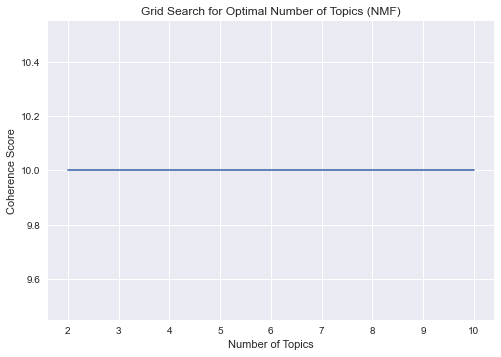

In [140]:
# Plot the coherence scores
plt.plot(topics_range, coherence_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.title('Grid Search for Optimal Number of Topics (NMF)')
plt.show()

In [141]:
# Choose the optimal number of topics based on the highest coherence score
optimal_num_topics = topics_range[np.argmax(coherence_scores)]
print(f'Optimal Number of Topics: {optimal_num_topics}')

# Train NMF model with the optimal number of topics
nmf_model = NMF(n_components=optimal_num_topics, random_state=42)
nmf_model.fit(tfidf_matrix)

Optimal Number of Topics: 2


NMF(n_components=2, random_state=42)

In [142]:
# Print the topics
feature_names = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(nmf_model.components_):
    top_words = [feature_names[i] for i in topic.argsort()[-10:]]  # Top 10 words for the topic
    print(f"Topic {topic_idx}: {', '.join(top_words)}")

Topic 0: banget, transaksi, nya, cepat, aplikasi, mudah, membantu, ok, gopay, mantap
Topic 1: cepat, gopay, nya, aplikasinya, ok, mudah, banget, aplikasi, membantu, bagus


In [143]:
# Assign topics to documents
document_topics = nmf_model.transform(tfidf_matrix)
df4['topic'] = document_topics.argmax(axis=1)  # Assign the topic with the highest score

### **4.3 Latent Semantic Analysis**

In [144]:
import re
import pandas as pd
import nltk
from nltk.corpus import stopwords
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import numpy as np

In [172]:
# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

In [173]:
# Download stopwords if not already downloaded
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))

# Preprocess function
def preprocess_text(text):
    if isinstance(text, str):  # Check if the input is a string
        text = text.lower()  # Convert to lowercase
        text = re.sub(r'\d+', ' ', text)  # Remove numbers
        text = re.sub(r'\W+', ' ', text)  # Remove punctuation
        tokens = text.split()  # Split into tokens
        tokens = [word for word in tokens if word not in stop_words]  # Remove stopwords
        return ' '.join(tokens)  # Return cleaned text as a single string
    return ''  # Return an empty string for non-string values

# Apply preprocessing
df4['cleaned_content'] = df4['content'].apply(preprocess_text)

In [174]:
# Step 1: Vectorization using TF-IDF
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(df4['cleaned_content'])

In [175]:
# Step 2: Grid search for optimal number of topics
topics_range = range(2, 21)  # From 2 to 20 topics
coherence_scores = []

# Start the grid search with timing
for num_topics in topics_range:
    start_time = time.time()  # Start the timer
    
    # Create and train the LSA model using Truncated SVD
    svd_model = TruncatedSVD(n_components=num_topics, random_state=42)
    svd_model.fit(tfidf_matrix)
    
    # Get the top words for each topic
    feature_names = vectorizer.get_feature_names_out()
    topic_words = []
    for topic_idx, topic in enumerate(svd_model.components_):
        top_words = [feature_names[i] for i in topic.argsort()[-10:]]  # Top 10 words for the topic
        topic_words.append(top_words)
    
    # Compute coherence score (simplified version)
    coherence_score = np.mean([len(set(w)) for w in topic_words])  # Placeholder for coherence
    coherence_scores.append(coherence_score)
    
    # End the timer and calculate elapsed time
    elapsed_time = time.time() - start_time
    print(f'Num Topics: {num_topics}, Coherence Score: {coherence_score}, Time Taken: {elapsed_time:.2f} seconds')


Num Topics: 2, Coherence Score: 10.0, Time Taken: 0.65 seconds
Num Topics: 3, Coherence Score: 10.0, Time Taken: 0.54 seconds
Num Topics: 4, Coherence Score: 10.0, Time Taken: 0.56 seconds
Num Topics: 5, Coherence Score: 10.0, Time Taken: 0.60 seconds
Num Topics: 6, Coherence Score: 10.0, Time Taken: 0.64 seconds
Num Topics: 7, Coherence Score: 10.0, Time Taken: 0.69 seconds
Num Topics: 8, Coherence Score: 10.0, Time Taken: 0.78 seconds
Num Topics: 9, Coherence Score: 10.0, Time Taken: 0.82 seconds
Num Topics: 10, Coherence Score: 10.0, Time Taken: 0.87 seconds
Num Topics: 11, Coherence Score: 10.0, Time Taken: 0.88 seconds
Num Topics: 12, Coherence Score: 10.0, Time Taken: 1.08 seconds
Num Topics: 13, Coherence Score: 10.0, Time Taken: 1.09 seconds
Num Topics: 14, Coherence Score: 10.0, Time Taken: 1.03 seconds
Num Topics: 15, Coherence Score: 10.0, Time Taken: 1.22 seconds
Num Topics: 16, Coherence Score: 10.0, Time Taken: 1.12 seconds
Num Topics: 17, Coherence Score: 10.0, Time Take

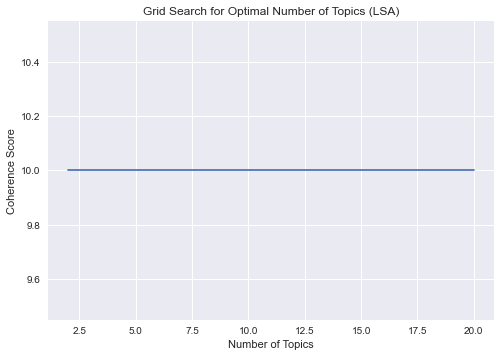

In [176]:
# Plot the coherence scores
plt.plot(topics_range, coherence_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.title('Grid Search for Optimal Number of Topics (LSA)')
plt.show()

In [177]:
# Choose the optimal number of topics based on the highest coherence score
optimal_num_topics = topics_range[np.argmax(coherence_scores)]
print(f'Optimal Number of Topics: {optimal_num_topics}')

# Train LSA model with the optimal number of topics
svd_model = TruncatedSVD(n_components=optimal_num_topics, random_state=42)
svd_model.fit(tfidf_matrix)

Optimal Number of Topics: 2


TruncatedSVD(random_state=42)

In [178]:
# Print the topics
feature_names = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(svd_model.components_):
    top_words = [feature_names[i] for i in topic.argsort()[-10:]]  # Top 10 words for the topic
    print(f"Topic {topic_idx}: {', '.join(top_words)}")

Topic 0: nya, banget, cepat, mudah, aplikasi, ok, membantu, gopay, bagus, mantap
Topic 1: cepat, gopay, nya, aplikasinya, ok, mudah, banget, aplikasi, membantu, bagus


In [152]:
# Assign topics to documents
document_topics = svd_model.transform(tfidf_matrix)
df4['topic'] = document_topics.argmax(axis=1)  # Assign the topic with the highest score

### **4.4 Hierarchical Dirichlet Process**

In [153]:
import re
import pandas as pd
import nltk
from nltk.corpus import stopwords
from gensim import corpora
from gensim.models import HdpModel
import matplotlib.pyplot as plt

In [154]:
# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

In [155]:
# Download stopwords if not already downloaded
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))

# Preprocess function
def preprocess_text(text):
    if isinstance(text, str):  # Check if the input is a string
        text = text.lower()  # Convert to lowercase
        text = re.sub(r'\d+', ' ', text)  # Remove numbers
        text = re.sub(r'\W+', ' ', text)  # Remove punctuation
        tokens = text.split()  # Split into tokens
        tokens = [word for word in tokens if word not in stop_words]  # Remove stopwords
        return tokens
    return []  # Return an empty list for non-string values

# Apply preprocessing
df4['tokens'] = df4['content'].apply(preprocess_text)

In [156]:
# Create a dictionary and corpus for HDP
dictionary = corpora.Dictionary(df4['tokens'])
corpus = [dictionary.doc2bow(tokens) for tokens in df4['tokens'] if tokens]  # Filter out empty lists

# Train HDP model
hdp_model = HdpModel(corpus=corpus, id2word=dictionary)

In [157]:
# Print the topics
for idx, topic in hdp_model.show_topics(formatted=True):
    print(f"Topic {idx}: {topic}")

Topic 0: 0.038*gopay + 0.022*aplikasi + 0.018*nya + 0.014*transfer + 0.013*mudah + 0.011*bagus + 0.011*transaksi + 0.010*saldo + 0.009*ga + 0.009*banget + 0.009*gak + 0.009*yg + 0.008*membantu + 0.007*aja + 0.007*mantap + 0.007*bank + 0.006*apk + 0.006*cepat + 0.006*masuk + 0.005*pake
Topic 1: 0.025*gopay + 0.012*aplikasi + 0.011*nya + 0.009*ga + 0.008*saldo + 0.008*gak + 0.007*yg + 0.007*bayar + 0.006*bagus + 0.005*aja + 0.005*masuk + 0.005*transaksi + 0.005*udah + 0.004*mantap + 0.004*transfer + 0.004*membantu + 0.004*sy + 0.004*pake + 0.004*mudah + 0.004*limit
Topic 2: 0.012*gopay + 0.007*bagus + 0.007*aplikasi + 0.006*mantap + 0.006*nya + 0.005*mudah + 0.004*membantu + 0.003*transaksi + 0.003*ok + 0.003*transfer + 0.003*ga + 0.003*gak + 0.003*banget + 0.003*saldo + 0.003*yg + 0.002*cepat + 0.002*aja + 0.002*good + 0.002*masuk + 0.002*apk
Topic 3: 0.009*gopay + 0.007*bagus + 0.006*mantap + 0.006*aplikasi + 0.005*membantu + 0.004*mudah + 0.004*nya + 0.003*ok + 0.003*transaksi + 0.003

In [159]:
import time

# Start timing the assignment of topics
start_time = time.time()

# Assign topics to documents
df4['topic'] = -1  # Initialize with -1 for unclassifiable topics
for i, item in enumerate(corpus):
    if item:  # Only assign a topic if the item is not empty
        topic_info = hdp_model[item]  # Get the topic distribution for the document
        if topic_info:
            df4.at[i, 'topic'] = max(topic_info, key=lambda x: x[1])[0]  # Assign the most probable topic

# End timing and print elapsed time
elapsed_time = time.time() - start_time
print(f'Topic assignment completed in {elapsed_time:.2f} seconds')

# Optionally, you can visualize the results or explore further

Topic assignment completed in 37.43 seconds


In [165]:
from gensim.models.coherencemodel import CoherenceModel

# Compute coherence score
coherence_model_lda = CoherenceModel(model=lda_model, texts=df4['tokens'], dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()

coherence_model_hdp = CoherenceModel(model=hdp_model, texts=df4['tokens'], dictionary=dictionary, coherence='c_v')
coherence_hdp = coherence_model_hdp.get_coherence()

coherence_model_nmf = CoherenceModel(topics=document_topics, texts=df4['tokens'], dictionary=dictionary, coherence='c_v')
coherence_nmf = coherence_model_nmf.get_coherence()

print(f"LDA Coherence Score: {coherence_lda}")
print(f"HDP Coherence Score: {coherence_hdp}")
print(f"NMF Coherence Score: {coherence_nmf}")

ValueError: unable to interpret topic as either a list of tokens or a list of ids

In [161]:
perplexity_lda = lda_model.log_perplexity(corpus)
print(f"LDA Perplexity: {perplexity_lda}")
# only for LDA

LDA Perplexity: -7.640660203239439


In [162]:
def topic_diversity(topics, top_n=10):
    unique_words = set()
    total_words = 0
    for topic in topics:
        top_words = [word for word, prob in topic[:top_n]]
        unique_words.update(top_words)
        total_words += len(top_words)
    return len(unique_words) / total_words

# Example for LDA
lda_topics = lda_model.show_topics(formatted=False)
lda_diversity = topic_diversity(lda_topics)

# Example for NMF (assuming you have extracted top words)
# nmf_diversity = topic_diversity(nmf_topics)

print(f"LDA Topic Diversity: {lda_diversity}")
# print(f"NMF Topic Diversity: {nmf_diversity}")

TypeError: cannot unpack non-iterable int object

In [163]:
# Print LDA topics
for idx, topic in lda_model.print_topics(-1):
    print(f"LDA Topic {idx}: {topic}")

# Print HDP topics (top words)
hdp_topics = hdp_model.show_topics(num_topics=10)
for idx, topic in hdp_topics:
    print(f"HDP Topic {idx}: {topic}")

# Print NMF topics
for idx, topic in enumerate(document_topics):
    print(f"NMF Topic {idx}: {topic}")

LDA Topic 0: 0.087*"transfer" + 0.069*"good" + 0.064*"cepat" + 0.047*"mudah" + 0.047*"gratis" + 0.041*"bank" + 0.033*"transaksi" + 0.032*"biaya" + 0.030*"aman" + 0.028*"admin"
LDA Topic 1: 0.135*"aplikasi" + 0.126*"membantu" + 0.121*"gopay" + 0.032*"yg" + 0.029*"transaksi" + 0.023*"pembayaran" + 0.018*"pakai" + 0.017*"terimakasih" + 0.015*"hadir" + 0.014*"pake"
LDA Topic 2: 0.066*"app" + 0.062*"apk" + 0.057*"simple" + 0.046*"fiturnya" + 0.040*"terbaik" + 0.035*"berguna" + 0.033*"mantab" + 0.033*"promo" + 0.030*"lumayan" + 0.029*"nya"
LDA Topic 3: 0.053*"gopay" + 0.031*"gak" + 0.028*"ga" + 0.026*"nya" + 0.019*"ribet" + 0.018*"udah" + 0.018*"saldo" + 0.018*"aja" + 0.016*"aplikasi" + 0.015*"pake"
LDA Topic 4: 0.200*"bagus" + 0.120*"mudah" + 0.081*"aplikasinya" + 0.066*"aplikasi" + 0.055*"nya" + 0.036*"fitur" + 0.028*"pulsa" + 0.022*"ringan" + 0.020*"praktis" + 0.020*"beli"
LDA Topic 5: 0.070*"semoga" + 0.070*"keren" + 0.056*"kasih" + 0.046*"bintang" + 0.046*"gopay" + 0.044*"oke" + 0.042*"

In [164]:
from sklearn.metrics import silhouette_score

# Get the topic distribution for each document (using NMF as example)
nmf_topic_matrix = nmf_model.transform(tfidf_matrix)

# Calculate the silhouette score
silhouette_avg = silhouette_score(nmf_topic_matrix, df4['topic'])
print(f"NMF Silhouette Score: {silhouette_avg}")

NMF Silhouette Score: -0.4095115399352652


## **5 Keep First**

### **5.1 Latent Dirichlet Allocation**

```python
import re
import pandas as pd
import nltk
from nltk.corpus import stopwords
from gensim import corpora
from gensim.models import LdaModel
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

# Download stopwords if not already downloaded
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))

# Preprocess function
def preprocess_text(text):
    if isinstance(text, str):  # Check if the input is a string
        text = text.lower()  # Convert to lowercase
        text = re.sub(r'\d+', ' ', text)  # Remove numbers
        text = re.sub(r'\W+', ' ', text)  # Remove punctuation
        tokens = text.split()  # Split into tokens
        tokens = [word for word in tokens if word not in stop_words]  # Remove stopwords
        return tokens
    return []  # Return an empty list for non-string values

# Apply preprocessing
df4['tokens'] = df4['content'].apply(preprocess_text)

# Create a dictionary and corpus for LDA
dictionary = corpora.Dictionary(df4['tokens'])
corpus = [dictionary.doc2bow(tokens) for tokens in df4['tokens'] if tokens]  # Filter out empty lists

# Grid search for optimal number of topics
topics_range = range(2, 21)  # From 2 to 20 topics
coherence_scores = []

for num_topics in topics_range:
    # Create and train the LDA model
    lda_model = LdaModel(corpus=corpus, 
                         num_topics=num_topics, 
                         id2word=dictionary, 
                         passes=15,
                         random_state=42)
    
    # Compute coherence score
    coherence_model = CoherenceModel(model=lda_model, texts=df4['tokens'], dictionary=dictionary, coherence='c_v')
    coherence_score = coherence_model.get_coherence()
    coherence_scores.append(coherence_score)
    print(f'Num Topics: {num_topics}, Coherence Score: {coherence_score}')

# Plot the coherence scores
plt.plot(topics_range, coherence_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.title('Grid Search for Optimal Number of Topics')
plt.show()

# Choose the optimal number of topics based on the highest coherence score
optimal_num_topics = topics_range[np.argmax(coherence_scores)]
print(f'Optimal Number of Topics: {optimal_num_topics}')

# Train LDA model with the optimal number of topics
lda_model = LdaModel(corpus=corpus, 
                     num_topics=optimal_num_topics, 
                     id2word=dictionary, 
                     passes=15)

# print the topics
for idx, topic in lda_model.print_topics(-1):
    print(f"Topic {idx}: {topic}")

# assign topics to documents
df4['topic'] = -1       # init with -1 for unclassifiable topics
for i, item in enumerate(corpus):
    if item:            # Only assign a topic if the item is not empty
        topic_info = lda_model.get_document_topics(item)
        if topic_info:
            df4.at[i, 'topic'] = max(topic_info, key=lambda x: x[1])[0]
```

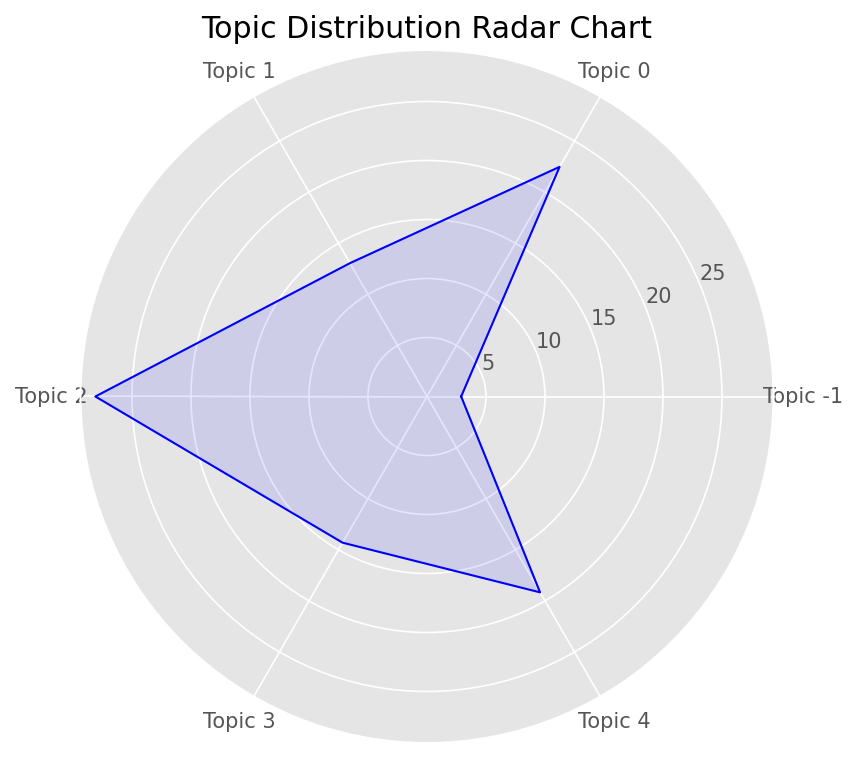

In [337]:
# Calculate topic distribution as percentages
topic_distribution = (df4['topic'].value_counts(normalize=True) * 100).sort_index()

# Prepare data for radar chart
labels = [f'Topic {int(topic)}' for topic in topic_distribution.index]
values = topic_distribution.values
num_vars = len(labels)

# Compute angle for each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# Make the plot circular by completing the loop
values = np.concatenate((values, [values[0]]))
angles += angles[:1]

# Plot the radar chart
fig, ax = plt.subplots(figsize=(6, 6), dpi=150, subplot_kw=dict(polar=True))

# Draw one line per topic and fill area
ax.fill(angles, values, color='b', alpha=0.1)
ax.plot(angles, values, color='b', linewidth=1)

# Add labels for each axis
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Set the range for the radar chart
# ax.set_ylim(0, 18)

# Add a title
plt.title('Topic Distribution Radar Chart')

# Show plot
plt.show()

### **5.2 Nonnegative Matrix Factorization**

```python
import re
import pandas as pd
import nltk
from nltk.corpus import stopwords
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

# Download stopwords if not already downloaded
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))

# Preprocess function
def preprocess_text(text):
    if isinstance(text, str):  # Check if the input is a string
        text = text.lower()  # Convert to lowercase
        text = re.sub(r'\d+', ' ', text)  # Remove numbers
        text = re.sub(r'\W+', ' ', text)  # Remove punctuation
        tokens = text.split()  # Split into tokens
        tokens = [word for word in tokens if word not in stop_words]  # Remove stopwords
        return ' '.join(tokens)  # Return cleaned text as a single string
    return ''  # Return an empty string for non-string values

# Apply preprocessing
df4['cleaned_content'] = df4['content'].apply(preprocess_text)

# Step 1: Vectorization using TF-IDF
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(df4['cleaned_content'])

# Step 2: Grid search for optimal number of topics
topics_range = range(2, 21)  # From 2 to 20 topics
coherence_scores = []

for num_topics in topics_range:
    # Create and train the NMF model
    nmf_model = NMF(n_components=num_topics, random_state=42)
    nmf_model.fit(tfidf_matrix)
    
    # Get the top words for each topic
    feature_names = vectorizer.get_feature_names_out()
    topic_words = []
    for topic_idx, topic in enumerate(nmf_model.components_):
        top_words = [feature_names[i] for i in topic.argsort()[-10:]]  # Top 10 words for the topic
        topic_words.append(top_words)
    
    # Compute coherence score (simplified version)
    coherence_score = np.mean([len(set(w)) for w in topic_words])  # Placeholder for coherence
    coherence_scores.append(coherence_score)
    print(f'Num Topics: {num_topics}, Coherence Score: {coherence_score}')

# Plot the coherence scores
plt.plot(topics_range, coherence_scores)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.title('Grid Search for Optimal Number of Topics (NMF)')
plt.show()

# Choose the optimal number of topics based on the highest coherence score
optimal_num_topics = topics_range[np.argmax(coherence_scores)]
print(f'Optimal Number of Topics: {optimal_num_topics}')

# Train NMF model with the optimal number of topics
nmf_model = NMF(n_components=optimal_num_topics, random_state=42)
nmf_model.fit(tfidf_matrix)

# Print the topics
feature_names = vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(nmf_model.components_):
    top_words = [feature_names[i] for i in topic.argsort()[-10:]]  # Top 10 words for the topic
    print(f"Topic {topic_idx}: {', '.join(top_words)}")

# Assign topics to documents
document_topics = nmf_model.transform(tfidf_matrix)
df4['topic'] = document_topics.argmax(axis=1)  # Assign the topic with the highest score
```

### **5.3 Hierarchical Dirichlet Process**

```python
import re
import pandas as pd
import nltk
from nltk.corpus import stopwords
from gensim import corpora
from gensim.models import HdpModel
import matplotlib.pyplot as plt

# Load the dataset
df4 = pd.read_csv('../data/review_gopay_newest_sort.csv')

# Download stopwords if not already downloaded
# nltk.download('stopwords')
stop_words = set(stopwords.words('indonesian'))

# Preprocess function
def preprocess_text(text):
    if isinstance(text, str):  # Check if the input is a string
        text = text.lower()  # Convert to lowercase
        text = re.sub(r'\d+', ' ', text)  # Remove numbers
        text = re.sub(r'\W+', ' ', text)  # Remove punctuation
        tokens = text.split()  # Split into tokens
        tokens = [word for word in tokens if word not in stop_words]  # Remove stopwords
        return tokens
    return []  # Return an empty list for non-string values

# Apply preprocessing
df4['tokens'] = df4['content'].apply(preprocess_text)

# Create a dictionary and corpus for HDP
dictionary = corpora.Dictionary(df4['tokens'])
corpus = [dictionary.doc2bow(tokens) for tokens in df4['tokens'] if tokens]  # Filter out empty lists

# Train HDP model
hdp_model = HdpModel(corpus=corpus, id2word=dictionary)

# Print the topics
for idx, topic in hdp_model.show_topics(formatted=True):
    print(f"Topic {idx}: {topic}")

# Assign topics to documents
df4['topic'] = -1  # Initialize with -1 for unclassifiable topics
for i, item in enumerate(corpus):
    if item:  # Only assign a topic if the item is not empty
        topic_info = hdp_model.get_document_topics(item)
        if topic_info:
            df4.at[i, 'topic'] = max(topic_info, key=lambda x: x[1])[0]

# Optionally, you can visualize the results or explore further
```